# **Pipeline de Detección y Seguimiento de Objetos**

### **Información general**

**Asignatura:** Visión por computador  
**Actividad:** Semana 3 - Detección y tracking de objetos  
**Fecha:** 28 de julio de 2026  
**Dataset:** Video de un cruce peatonal (varias personas cruzándose)  
**Fuente:** Video descargado de banco libre (Pexels)  
**Autores:**     
- Rodríguez Vélez Ximena Jhoana    
- Viteri Ayala Flavia Kamila  

### **Objetivo del proyecto**

Este notebook construye, paso a paso y con el pipeline clasico de deteccion y
seguimiento de objetos visto en las dos sesiones de clase de la semana 3,
un sistema que:

1. Carga un video real propio (cruce peatonal) y lo corta en fotogramas
   individuales.
2. Detecta los objetos presentes en la escena con YOLO preentrenado en COCO
   y describe cada uno (clase + nivel de confianza).
3. Compara los formatos de caja delimitadora COCO y YOLO, y calcula IoU,
   precision, recall y mAP a mano sobre esas detecciones.
4. Auto-etiqueta un dataset de entrenamiento a partir del video (Label
   Assist) y ajusta (fine-tuning) el modelo YOLO con esos datos propios.
5. Evalua el detector con una matriz de confusion (TP/FP/FN) construida a
   mano, sin depender de una libreria externa.
6. Sigue a las personas de un fotograma al siguiente con un tracker manual
   por centroides, y lo compara contra SORT y ByteTrack (libreria
   `trackers`), midiendo ID switches y una aproximacion de MOTA.
7. (Bonus) Compara dos modelos mas avanzados de vision (SAM 2.1 para
   segmentacion con un clic, y DINOv2 como backbone auto-supervisado) y
   cierra con una extension de calibracion que convierte el movimiento en
   pixeles a centimetros reales.

---
## **Sección 1:** Configuración del entorno y carga de librerías

In [2]:
import importlib.util
if importlib.util.find_spec("cv2") is None:
    %pip install -q opencv-python-headless

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

np.random.seed(7)  # semilla fija para que los números "aleatorios" no cambien cada vez que corro el notebook

print("OpenCV:", cv2.__version__)
print("NumPy:", np.__version__)


OpenCV: 5.0.0
NumPy: 2.4.2


---
## **Sección 2:** Importación del video

In [3]:
import urllib.request

RUTA_VIDEO_GITHUB = "https://raw.githubusercontent.com/fkviteri/uide-maestria/4152a819137ec97a9b55954ba8a0c4a6fa991b86/06-vision-por-computador/personas_video.mp4"
RUTA_VIDEO = "personas_video.mp4"

if not os.path.exists(RUTA_VIDEO):
    print("Descargando video desde GitHub...")
    urllib.request.urlretrieve(RUTA_VIDEO_GITHUB, RUTA_VIDEO)
    print("Descarga completa.")
else:
    print("El video ya estaba descargado localmente.")

El video ya estaba descargado localmente.


---
## **Sección 3:** Extracción de fotogramas del video

**Sesión de clase: 1**

Un detector de objetos trabaja con imágenes, no con video completo, así que el primer paso es
cortar el video en fotogramas individuales. No usamos todos los fotogramas (a 25 fps un video
de 18 segundos tiene más de 400) — saltamos varios entre cada captura para que el movimiento
se note de un fotograma al siguiente.


Se extrajeron 20 fotogramas


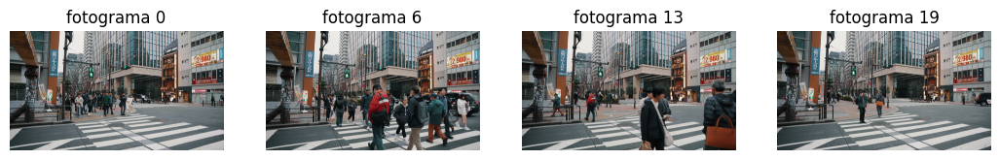

In [4]:
def extraer_fotogramas(ruta_video, cuantos=20, salto=23):
    cap = cv2.VideoCapture(ruta_video)
    fotogramas = []
    contador = 0
    while len(fotogramas) < cuantos:
        ok, frame = cap.read()
        if not ok:
            break  # se acabó el video
        if contador % salto == 0:
            fotogramas.append(frame)
        contador += 1
    cap.release()
    return fotogramas


frames = extraer_fotogramas(RUTA_VIDEO)
print(f"Se extrajeron {len(frames)} fotogramas")

# en vez de índices fijos, los calculamos según cuántos fotogramas haya
n = len(frames)
indices = [0, n // 3, 2 * n // 3, n - 1]

fig, axs = plt.subplots(1, 4, figsize=(13, 3.5))
for ax, i in zip(axs, indices):
    ax.imshow(cv2.cvtColor(frames[i], cv2.COLOR_BGR2RGB))
    ax.set_title(f"fotograma {i}")
    ax.axis("off")
plt.show()


---
## **Sección 4:** Detección con YOLO - Cajas de referencia y descripción de objetos

**Sesión de clase: 1**

En vez de dibujar cajas a mano sobre el video, usamos YOLO ya entrenado (en el dataset COCO)
para detectar objetos en el primer fotograma. Esas cajas se convierten en nuestra "referencia"
para el resto del notebook — el mismo criterio que usa Roboflow Label Assist: un modelo
propone, la persona revisa.


In [5]:
#%pip install -q ultralytics

YOLO encontró 16 objetos en el primer fotograma:
  - person: 0.69
  - person: 0.68
  - traffic light: 0.62
  - person: 0.59
  - person: 0.59
  - person: 0.57
  - person: 0.48
  - person: 0.46
  - car: 0.43
  - person: 0.43
  - person: 0.40
  - traffic light: 0.38
  - person: 0.37
  - person: 0.34
  - person: 0.30
  - person: 0.29


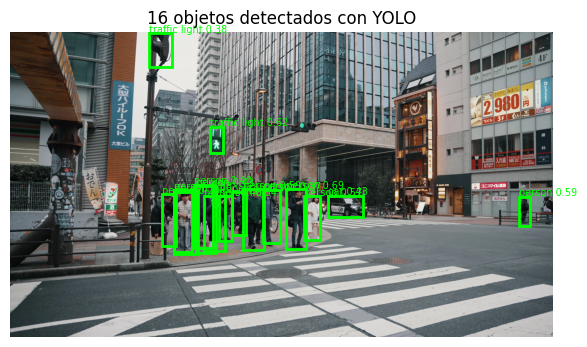

In [6]:
from ultralytics import YOLO

modelo = YOLO("yolo11n.pt")

primer_fotograma = frames[0]
resultado = modelo(primer_fotograma, verbose=False)[0]

cajas_gt = [tuple(float(v) for v in caja) for caja in resultado.boxes.xyxy]
clases_gt = [resultado.names[int(c)] for c in resultado.boxes.cls]
confianzas_gt = [float(c) for c in resultado.boxes.conf]

print(f"YOLO encontró {len(cajas_gt)} objetos en el primer fotograma:")
for clase, conf in zip(clases_gt, confianzas_gt):
    print(f"  - {clase}: {conf:.2f}")

fig, ax = plt.subplots(figsize=(7, 5))
ax.imshow(cv2.cvtColor(primer_fotograma, cv2.COLOR_BGR2RGB))
for (x1, y1, x2, y2), clase, conf in zip(cajas_gt, clases_gt, confianzas_gt):
    ax.add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor="lime", linewidth=2))
    ax.text(x1, y1 - 5, f"{clase} {conf:.2f}", color="lime", fontsize=7)
ax.set_title(f"{len(cajas_gt)} objetos detectados con YOLO")
ax.axis("off")
plt.show()

---
## **Sección 5:** Formatos de Bounding Box - COCO vs. YOLO

**Sesión de clase: 1**

Confundir estos dos formatos es el error más común al empezar con detección. COCO mide en
píxeles absolutos desde la esquina superior izquierda. YOLO normaliza todo entre 0 y 1
respecto al tamaño de la imagen y mide desde el CENTRO de la caja, no la esquina. Esta
conversión es la que hay que aplicar cada vez que se exporta un dataset entre herramientas que
no usan el mismo formato.


COCO (x, y, w, h): (1955, 1111, 136, 428)
YOLO (xc, yc, w, h) normalizado: (0.527, 0.613, 0.035, 0.198)
Reconstruida desde YOLO: (1955.0, 1110.9, 136.3, 427.8)


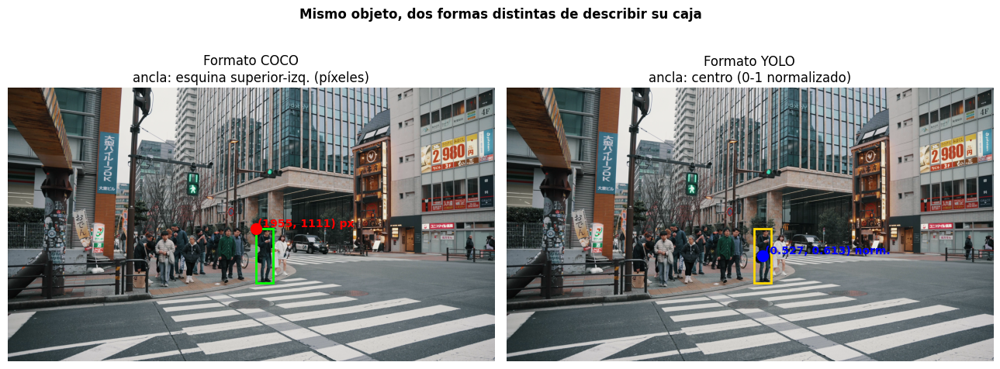

In [7]:
def coco_a_yolo(x, y, w, h, img_w, img_h):
    xc = (x + w / 2) / img_w
    yc = (y + h / 2) / img_h
    return xc, yc, w / img_w, h / img_h


def yolo_a_coco(xc, yc, w, h, img_w, img_h):
    x = (xc - w / 2) * img_w
    y = (yc - h / 2) * img_h
    return x, y, w * img_w, h * img_h


# tomamos la primera caja detectada como ejemplo
x1, y1, x2, y2 = cajas_gt[0]
x, y, w, h = x1, y1, x2 - x1, y2 - y1
print(f"COCO (x, y, w, h): ({x:.0f}, {y:.0f}, {w:.0f}, {h:.0f})")

img_h, img_w = primer_fotograma.shape[:2]
caja_yolo = coco_a_yolo(x, y, w, h, img_w, img_h)
print(f"YOLO (xc, yc, w, h) normalizado: ({caja_yolo[0]:.3f}, {caja_yolo[1]:.3f}, "
      f"{caja_yolo[2]:.3f}, {caja_yolo[3]:.3f})")

# TODO(estudiante): comprueba a mano con calculadora que esta reconstrucción
# coincide con la caja COCO original de arriba (redondeos aparte).
reconstruida = yolo_a_coco(*caja_yolo, img_w, img_h)
print(f"Reconstruida desde YOLO: {tuple(round(v, 1) for v in reconstruida)}")

# --- Parte visual: mostramos los dos formatos sobre la misma imagen ---
# COCO ancla desde la esquina superior-izquierda; YOLO ancla desde el
# centro. Dibujar ambos puntos de referencia sobre la caja real deja mucho
# más claro por qué la fórmula de conversión suma/resta w/2 y h/2.
xc_px = caja_yolo[0] * img_w  # centro YOLO ya "des-normalizado" a píxeles, solo para graficarlo
yc_px = caja_yolo[1] * img_h

fig, axs = plt.subplots(1, 2, figsize=(13, 5.5))

# --- Panel izquierdo: formato COCO (esquina + píxeles) ---
axs[0].imshow(cv2.cvtColor(primer_fotograma, cv2.COLOR_BGR2RGB))
axs[0].add_patch(Rectangle((x, y), w, h, fill=False, edgecolor="lime", linewidth=2))
axs[0].plot(x, y, "o", color="red", markersize=10)  # esquina superior-izquierda: el ancla de COCO
axs[0].annotate(f"({x:.0f}, {y:.0f}) px", (x, y), xytext=(x + 15, y - 15),
                 color="red", fontsize=10, weight="bold")
axs[0].set_title("Formato COCO\nancla: esquina superior-izq. (píxeles)")
axs[0].axis("off")

# --- Panel derecho: formato YOLO (centro + normalizado) ---
axs[1].imshow(cv2.cvtColor(primer_fotograma, cv2.COLOR_BGR2RGB))
axs[1].add_patch(Rectangle((x, y), w, h, fill=False, edgecolor="gold", linewidth=2))
axs[1].plot(xc_px, yc_px, "o", color="blue", markersize=10)  # centro: el ancla de YOLO
axs[1].annotate(f"({caja_yolo[0]:.3f}, {caja_yolo[1]:.3f}) norm.", (xc_px, yc_px),
                 xytext=(xc_px + 15, yc_px - 15), color="blue", fontsize=10, weight="bold")
axs[1].set_title("Formato YOLO\nancla: centro (0-1 normalizado)")
axs[1].axis("off")

plt.suptitle("Mismo objeto, dos formas distintas de describir su caja", fontsize=12, weight="bold")
plt.tight_layout()
plt.show()

---
## **Sección 6:** IoU Entre Cajas

**Sesión de clase: 1**

IoU (Intersection over Union) es el área donde dos cajas se solapan, dividida entre el área
total que cubren juntas. Es la métrica base de la que salen precisión, recall y mAP más
adelante. Como no tenemos un segundo modelo a la mano para comparar, simulamos una predicción
"ruidosa" moviendo un poco la caja de referencia.


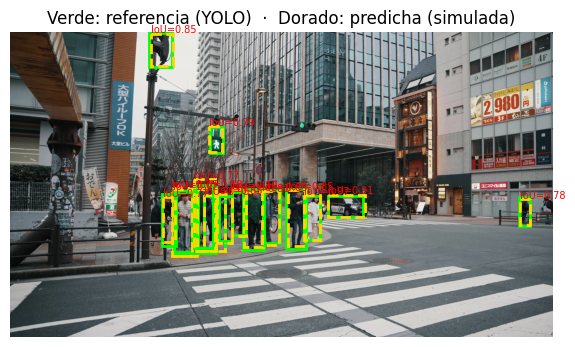

In [8]:
def iou(caja_a, caja_b):
    xa1, ya1, xa2, ya2 = caja_a
    xb1, yb1, xb2, yb2 = caja_b
    xi1, yi1 = max(xa1, xb1), max(ya1, yb1)
    xi2, yi2 = min(xa2, xb2), min(ya2, yb2)
    interseccion = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    area_a = (xa2 - xa1) * (ya2 - ya1)
    area_b = (xb2 - xb1) * (yb2 - yb1)
    union = area_a + area_b - interseccion
    return interseccion / union if union > 0 else 0.0


def desplazar_caja(caja, dx, dy, escala=1.0):
    x1, y1, x2, y2 = caja
    cx, cy = (x1 + x2) / 2 + dx, (y1 + y2) / 2 + dy
    hw, hh = (x2 - x1) / 2 * escala, (y2 - y1) / 2 * escala
    return (cx - hw, cy - hh, cx + hw, cy + hh)


rng = np.random.default_rng(3)
cajas_pred = [desplazar_caja(c, rng.integers(-8, 9), rng.integers(-8, 9),
                              escala=rng.uniform(0.85, 1.15)) for c in cajas_gt]

fig, ax = plt.subplots(figsize=(7, 5))
ax.imshow(cv2.cvtColor(primer_fotograma, cv2.COLOR_BGR2RGB))
for c_real, c_pred in zip(cajas_gt, cajas_pred):
    valor_iou = iou(c_real, c_pred)
    ax.add_patch(Rectangle((c_real[0], c_real[1]), c_real[2]-c_real[0], c_real[3]-c_real[1],
                            fill=False, edgecolor="lime", linewidth=2))
    ax.add_patch(Rectangle((c_pred[0], c_pred[1]), c_pred[2]-c_pred[0], c_pred[3]-c_pred[1],
                            fill=False, edgecolor="gold", linewidth=2, linestyle="--"))
    ax.text(c_pred[0], c_pred[1] - 5, f"IoU={valor_iou:.2f}", color="red", fontsize=7)
ax.set_title("Verde: referencia (YOLO)  ·  Dorado: predicha (simulada)")
ax.axis("off")
plt.show()


---
## **Sección 7:** Precisión, Recall y mAP a mano

**Sesión de clase: 1**

Simulamos que cada predicción trae un puntaje de confianza y calculamos precisión y recall a
distintos umbrales — la base de la curva Precision-Recall. Después resumimos todo eso en un
solo número: el AP (Average Precision), y su versión más completa, mAP50-95, que promedia el
AP usando distintos niveles de exigencia de IoU (de 0.50 a 0.95).


umbral=0.9 -> aceptadas=2  precisión=1.00  recall=0.12
umbral=0.7 -> aceptadas=11  precisión=1.00  recall=0.69
umbral=0.5 -> aceptadas=13  precisión=1.00  recall=0.81
umbral=0.3 -> aceptadas=16  precisión=1.00  recall=1.00

AP@0.5: 1.000
mAP50-95 (promedio de 10 umbrales): 0.825


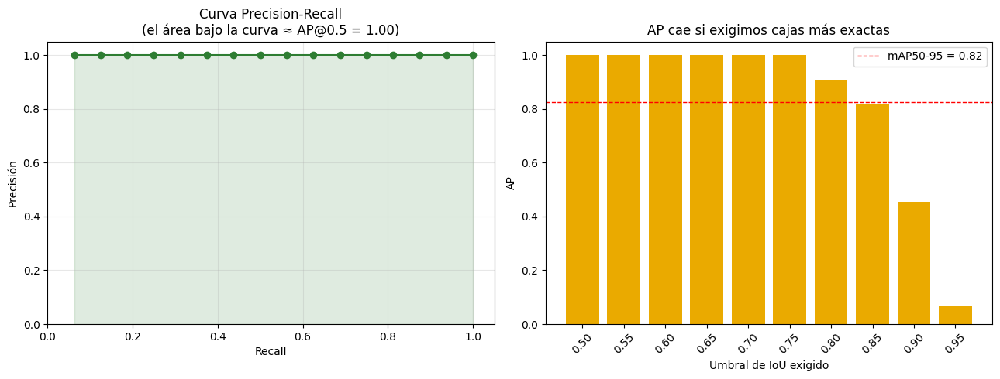

In [9]:
def ap_simplificado(lista_iou, lista_confianza, umbral_iou=0.5):
    orden = np.argsort(-np.array(lista_confianza))
    aciertos = np.array(lista_iou)[orden] >= umbral_iou
    precisiones = []
    tp = 0
    for i, acierto in enumerate(aciertos, start=1):
        tp += int(acierto)
        precisiones.append(tp / i)
    return float(np.mean(precisiones))


confianzas = rng.uniform(0.3, 0.99, size=len(cajas_pred))
lista_iou = [iou(c_real, c_pred) for c_real, c_pred in zip(cajas_gt, cajas_pred)]

resultados_umbral = []  # guardamos cada fila para poder graficarla después
for umbral in [0.9, 0.7, 0.5, 0.3]:
    aceptadas = confianzas >= umbral
    tp = sum(1 for a, v in zip(aceptadas, lista_iou) if a and v >= 0.5)
    precision = tp / max(aceptadas.sum(), 1)
    recall = tp / len(cajas_gt)
    resultados_umbral.append((umbral, precision, recall))
    print(f"umbral={umbral:.1f} -> aceptadas={aceptadas.sum()}  precisión={precision:.2f}  recall={recall:.2f}")

ap50 = ap_simplificado(lista_iou, confianzas, umbral_iou=0.5)
umbrales_iou = np.arange(0.5, 1.0, 0.05)
ap_por_umbral = [ap_simplificado(lista_iou, confianzas, u) for u in umbrales_iou]
print(f"\nAP@0.5: {ap50:.3f}")
print(f"mAP50-95 (promedio de 10 umbrales): {np.mean(ap_por_umbral):.3f}")

# --- Parte visual: dos gráficos lado a lado ---
fig, axs = plt.subplots(1, 2, figsize=(13, 5))

# --- Panel izquierdo: curva Precision-Recall ---
# ordenamos por confianza descendente y recalculamos precision/recall
# ACUMULADOS punto a punto -> esta es la curva de la que sale el AP
orden = np.argsort(-confianzas)
aciertos_ordenados = np.array(lista_iou)[orden] >= 0.5
precisiones_curva, recalls_curva = [], []
tp_acum = 0
for i, acierto in enumerate(aciertos_ordenados, start=1):
    tp_acum += int(acierto)
    precisiones_curva.append(tp_acum / i)
    recalls_curva.append(tp_acum / len(cajas_gt))

axs[0].plot(recalls_curva, precisiones_curva, "o-", color="#2E7D32")
axs[0].fill_between(recalls_curva, precisiones_curva, alpha=0.15, color="#2E7D32")
axs[0].set_xlabel("Recall")
axs[0].set_ylabel("Precisión")
axs[0].set_title(f"Curva Precision-Recall\n(el área bajo la curva ≈ AP@0.5 = {ap50:.2f})")
axs[0].set_xlim(0, 1.05)
axs[0].set_ylim(0, 1.05)
axs[0].grid(alpha=0.3)

# --- Panel derecho: AP cae mientras más estricto el IoU exigido ---
axs[1].bar([f"{u:.2f}" for u in umbrales_iou], ap_por_umbral, color="#EAAA00")
axs[1].axhline(np.mean(ap_por_umbral), color="red", linestyle="--", linewidth=1,
                label=f"mAP50-95 = {np.mean(ap_por_umbral):.2f}")
axs[1].set_xlabel("Umbral de IoU exigido")
axs[1].set_ylabel("AP")
axs[1].set_title("AP cae si exigimos cajas más exactas")
axs[1].set_ylim(0, 1.05)
axs[1].legend()
axs[1].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

---
## **Sección 8:** Auto-Etiquetar y Preparar un Dataset YOLO

**Sesión de clase: 2**

Corremos YOLO sobre varios fotogramas del video y guardamos lo que detecta como si fueran
etiquetas de entrenamiento — esto es Label Assist en acción: el modelo propone las cajas, y en
un caso real uno revisaría manualmente las que estén mal. El resultado queda en el formato de
carpetas que espera `ultralytics` para entrenar.


Dataset auto-etiquetado con 20 fotogramas. Clases: ['person', 'car', 'traffic light']
train: c:\Users\fkva_\OneDrive\Escritorio\UIDE\uide-maestria\06-vision-por-computador\dataset_video/images/train
val: c:\Users\fkva_\OneDrive\Escritorio\UIDE\uide-maestria\06-vision-por-computador\dataset_video/images/val
nc: 3
names: ['person', 'car', 'traffic light']



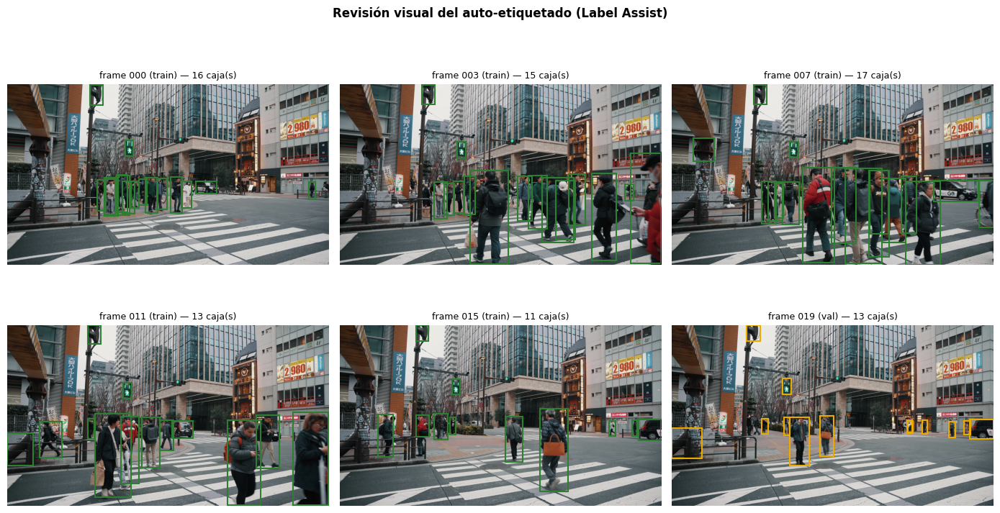

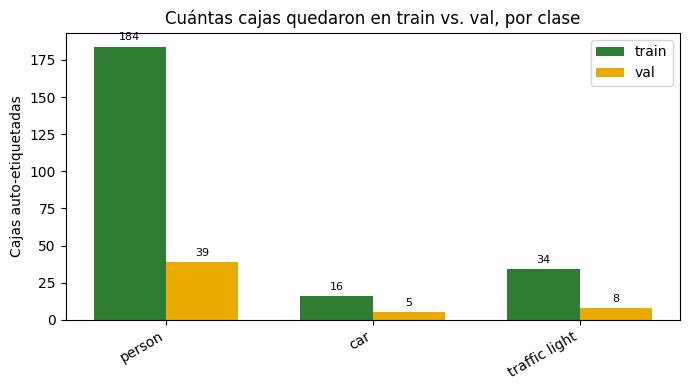

In [10]:
CLASES_USADAS = sorted({int(c) for c in resultado.boxes.cls})
NOMBRES_CLASES = [modelo.names[c] for c in CLASES_USADAS]

carpeta_ds = "dataset_video"
for split in ["train", "val"]:
    os.makedirs(f"{carpeta_ds}/images/{split}", exist_ok=True)
    os.makedirs(f"{carpeta_ds}/labels/{split}", exist_ok=True)

n_train = int(round(len(frames) * 0.8))  # 80/20 train/val, la división más común

# guardamos también las cajas de cada fotograma en memoria, solo para poder
# graficarlas después sin tener que releer los .txt del disco
cajas_por_fotograma = []

for i, frame in enumerate(frames):
    split = "train" if i < n_train else "val"
    cv2.imwrite(f"{carpeta_ds}/images/{split}/frame_{i:03d}.jpg", frame)

    r = modelo(frame, verbose=False)[0]  # esto ES el auto-etiquetado
    ih, iw = frame.shape[:2]
    cajas_frame = []
    with open(f"{carpeta_ds}/labels/{split}/frame_{i:03d}.txt", "w") as f:
        for caja, clase in zip(r.boxes.xyxy.cpu().numpy(), r.boxes.cls.cpu().numpy()):
            if int(clase) not in CLASES_USADAS:
                continue
            x1, y1, x2, y2 = caja
            idx_clase = CLASES_USADAS.index(int(clase))
            xc, yc, w, h = coco_a_yolo(x1, y1, x2 - x1, y2 - y1, iw, ih)
            f.write(f"{idx_clase} {xc:.6f} {yc:.6f} {w:.6f} {h:.6f}\n")
            cajas_frame.append((x1, y1, x2, y2, NOMBRES_CLASES[idx_clase]))
    cajas_por_fotograma.append((split, cajas_frame))

data_yaml = f"""train: {os.path.abspath(carpeta_ds)}/images/train
val: {os.path.abspath(carpeta_ds)}/images/val
nc: {len(NOMBRES_CLASES)}
names: {NOMBRES_CLASES}
"""
with open(f"{carpeta_ds}/data.yaml", "w") as f:
    f.write(data_yaml)

print(f"Dataset auto-etiquetado con {len(frames)} fotogramas. Clases: {NOMBRES_CLASES}")
print(data_yaml)

# --- Parte visual 1: revisar 6 fotogramas auto-etiquetados ---
# Esto es exactamente el paso de "revisión humana" de Label Assist: mirar
# las cajas que propuso el modelo antes de confiar en ellas para entrenar.
indices_muestra = np.linspace(0, len(frames) - 1, 6, dtype=int)
fig, axs = plt.subplots(2, 3, figsize=(14, 8))
for ax, i in zip(axs.flat, indices_muestra):
    split, cajas_frame = cajas_por_fotograma[i]
    color = "#2E7D32" if split == "train" else "#EAAA00"
    ax.imshow(cv2.cvtColor(frames[i], cv2.COLOR_BGR2RGB))
    for x1, y1, x2, y2, nombre in cajas_frame:
        ax.add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor=color, linewidth=1.5))
    ax.set_title(f"frame {i:03d} ({split}) — {len(cajas_frame)} caja(s)", fontsize=9)
    ax.axis("off")
plt.suptitle("Revisión visual del auto-etiquetado (Label Assist)", fontsize=12, weight="bold")
plt.tight_layout()
plt.show()

# --- Parte visual 2: cuántas cajas por clase quedaron en train vs val ---
from collections import Counter
conteo_train = Counter(nombre for split, cajas in cajas_por_fotograma if split == "train" for *_, nombre in cajas)
conteo_val = Counter(nombre for split, cajas in cajas_por_fotograma if split == "val" for *_, nombre in cajas)

fig, ax = plt.subplots(figsize=(7, 4))
x = np.arange(len(NOMBRES_CLASES))
ancho = 0.35
barras_train = ax.bar(x - ancho/2, [conteo_train.get(c, 0) for c in NOMBRES_CLASES], ancho, label="train", color="#2E7D32")
barras_val = ax.bar(x + ancho/2, [conteo_val.get(c, 0) for c in NOMBRES_CLASES], ancho, label="val", color="#EAAA00")

ax.bar_label(barras_train, padding=3, fontsize=8)
ax.bar_label(barras_val, padding=3, fontsize=8)

ax.set_xticks(x)
ax.set_xticklabels(NOMBRES_CLASES, rotation=30, ha="right")
ax.set_ylabel("Cajas auto-etiquetadas")
ax.set_title("Cuántas cajas quedaron en train vs. val, por clase")
ax.legend()
plt.tight_layout()
plt.show()

---
## **Sección 9:** Fine-Tuning de YOLO Sobre Tu Video (Bonus)

**Sesión de clase: 2**

En vez de entrenar una red desde cero (que necesitaría muchísimos más datos y horas de GPU),
partimos de los pesos que YOLO ya trae entrenados en COCO y los seguimos ajustando un poco con
nuestro propio dataset. Usamos pocas épocas porque esto es solo una demostración de clase, no
un entrenamiento real de producción.


New https://pypi.org/project/ultralytics/8.4.114 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.107  Python-3.13.12 torch-2.13.0+cpu CPU (AMD Ryzen 7 4700U with Radeon Graphics)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=False, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset_video/data.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=320, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=

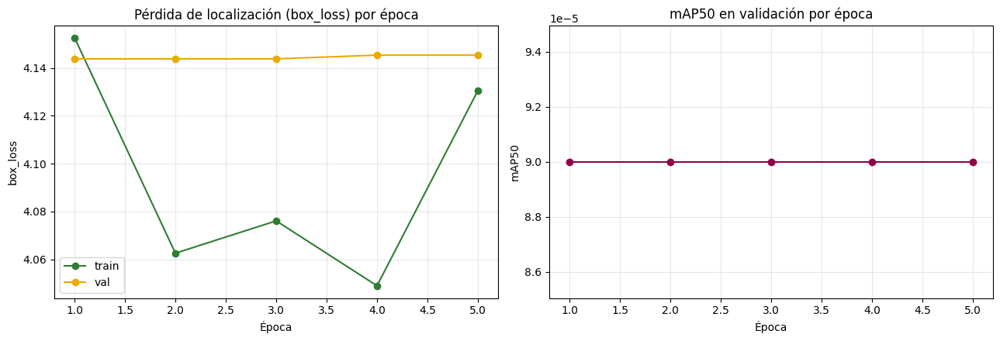

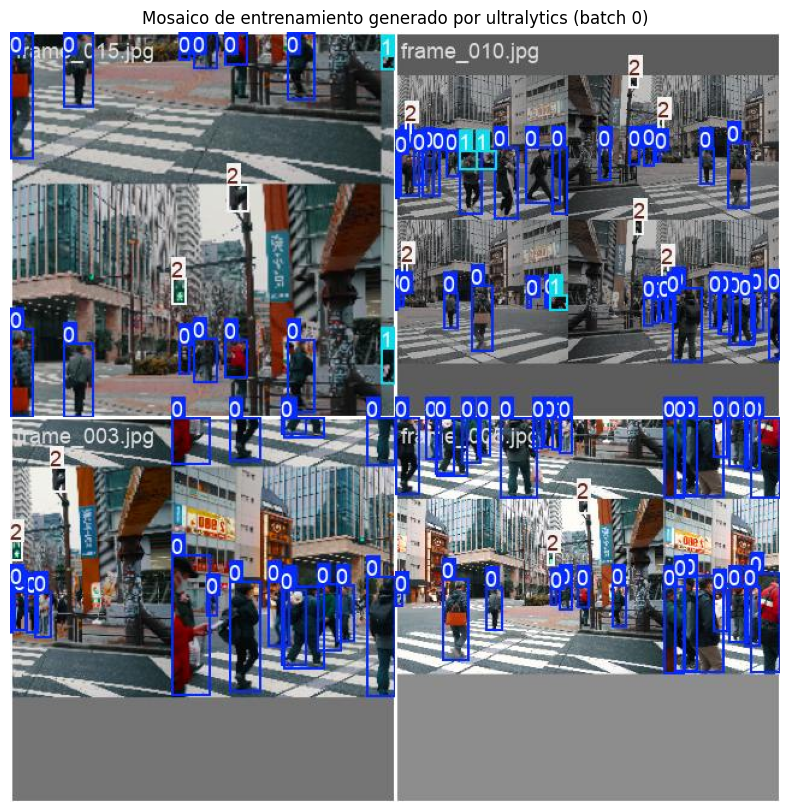

In [11]:
entrenamiento = modelo.train(
    data=f"{carpeta_ds}/data.yaml",
    epochs=5, imgsz=320, batch=4,  # pocas épocas / batch chico -> rápido para la práctica
    project="runs", name="ejercicio_kamila", seed=7, verbose=False,
)
print("Entrenamiento de demostración completo.")
print(f"Resultados guardados en: {entrenamiento.save_dir}")

# --- Parte visual 1: curva de pérdida y métricas por época ---
# ultralytics guarda un results.csv con una fila por época (loss, precisión,
# recall, mAP...) — lo leemos directo con pandas, sin tener que llevar
# nosotros la cuenta manualmente durante el entrenamiento.
import pandas as pd

ruta_resultados = os.path.join(str(entrenamiento.save_dir), "results.csv")
df = pd.read_csv(ruta_resultados)
df.columns = [c.strip() for c in df.columns]  # ultralytics deja espacios en los nombres de columna

fig, axs = plt.subplots(1, 2, figsize=(13, 4.5))

axs[0].plot(df["epoch"], df["train/box_loss"], "o-", label="train", color="#2E7D32")
if "val/box_loss" in df.columns:
    axs[0].plot(df["epoch"], df["val/box_loss"], "o-", label="val", color="#EAAA00")
axs[0].set_xlabel("Época")
axs[0].set_ylabel("box_loss")
axs[0].set_title("Pérdida de localización (box_loss) por época")
axs[0].legend()
axs[0].grid(alpha=0.3)

col_map = [c for c in df.columns if "mAP50" in c and "95" not in c]
if col_map:
    axs[1].plot(df["epoch"], df[col_map[0]], "o-", color="#910048")
    axs[1].set_xlabel("Época")
    axs[1].set_ylabel("mAP50")
    axs[1].set_title("mAP50 en validación por época")
    axs[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# --- Parte visual 2: mosaico que ultralytics genera solo, con las cajas
# reales de un batch de entrenamiento (útil para revisar que las etiquetas
# quedaron bien puestas, no solo confiar en el número de la Sección 8) ---
ruta_batch = os.path.join(str(entrenamiento.save_dir), "train_batch0.jpg")
if os.path.exists(ruta_batch):
    img_batch = cv2.imread(ruta_batch)
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(img_batch, cv2.COLOR_BGR2RGB))
    plt.title("Mosaico de entrenamiento generado por ultralytics (batch 0)")
    plt.axis("off")
    plt.show()

---
## **Sección 10:** Comparar Modelo Base vs. Modelo Ajustado (Bonus)

**Sesión de clase: 2**

Comparamos el modelo original (solo entrenado en COCO) contra el que acabamos de ajustar con
nuestro video, sobre la misma imagen de validación — así comprobamos si el fine-tuning
realmente cambió algo.


Modelo base:     5 cajas detectadas
Modelo ajustado: 0 cajas detectadas


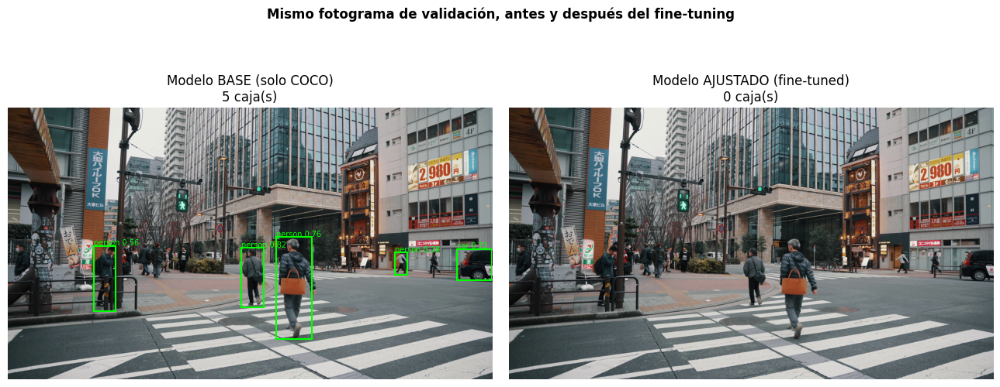

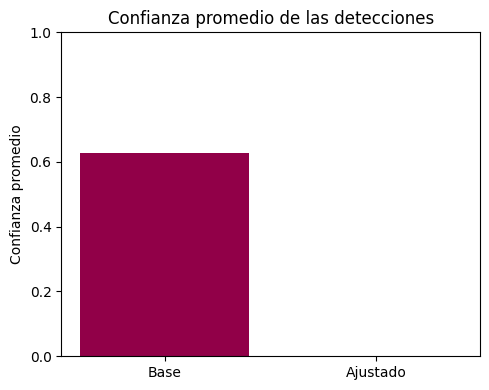

In [12]:
ruta_pesos = os.path.join(str(entrenamiento.save_dir), "weights", "best.pt")
modelo_ajustado = YOLO(ruta_pesos)

img_val = sorted(os.listdir(f"{carpeta_ds}/images/val"))[0]
ruta_img_val = f"{carpeta_ds}/images/val/{img_val}"

r_base = modelo(ruta_img_val, verbose=False)[0]
r_ajustado = modelo_ajustado(ruta_img_val, verbose=False)[0]

print(f"Modelo base:     {len(r_base.boxes)} cajas detectadas")
print(f"Modelo ajustado: {len(r_ajustado.boxes)} cajas detectadas")

# --- Parte visual: mismo fotograma, dos modelos, lado a lado ---
img_original = cv2.imread(ruta_img_val)
img_original_rgb = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

fig, axs = plt.subplots(1, 2, figsize=(13, 6))

for ax, resultado, titulo in [
    (axs[0], r_base, f"Modelo BASE (solo COCO)\n{len(r_base.boxes)} caja(s)"),
    (axs[1], r_ajustado, f"Modelo AJUSTADO (fine-tuned)\n{len(r_ajustado.boxes)} caja(s)"),
]:
    ax.imshow(img_original_rgb)
    for caja, clase, conf in zip(resultado.boxes.xyxy.cpu().numpy(),
                                  resultado.boxes.cls.cpu().numpy(),
                                  resultado.boxes.conf.cpu().numpy()):
        x1, y1, x2, y2 = caja
        nombre = resultado.names[int(clase)]
        ax.add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor="lime", linewidth=1.5))
        ax.text(x1, y1 - 5, f"{nombre} {conf:.2f}", color="lime", fontsize=7)
    ax.set_title(titulo)
    ax.axis("off")

plt.suptitle("Mismo fotograma de validación, antes y después del fine-tuning", fontsize=12, weight="bold")
plt.tight_layout()
plt.show()

# --- Bonus: comparar también la confianza promedio, no solo el conteo ---
conf_base = r_base.boxes.conf.cpu().numpy() if len(r_base.boxes) else np.array([0])
conf_ajustado = r_ajustado.boxes.conf.cpu().numpy() if len(r_ajustado.boxes) else np.array([0])

fig, ax = plt.subplots(figsize=(5, 4))
ax.bar(["Base", "Ajustado"], [conf_base.mean(), conf_ajustado.mean()], color=["#910048", "#2E7D32"])
ax.set_ylabel("Confianza promedio")
ax.set_title("Confianza promedio de las detecciones")
ax.set_ylim(0, 1)
plt.tight_layout()
plt.show()

---
## **Sección 11:** Matriz de Confusión de detección a mano

**Sesión de clase: 2**

Calculamos TP/FP/FN sin usar ninguna librería: la caja "real" es la detección de YOLO
(referencia), y la "predicha" es esa misma caja con ruido, más un falso positivo que inventamos
a propósito en una esquina vacía de la imagen.


Verdaderos positivos: 16   Falsos positivos: 1   Falsos negativos: 0
Precisión: 0.94   Recall: 1.00


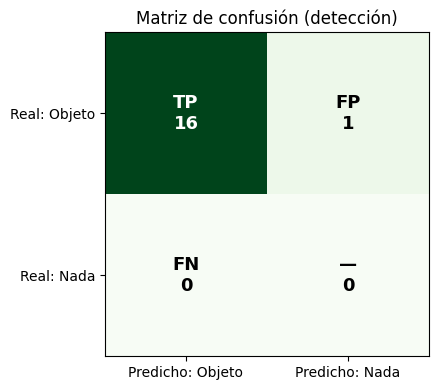

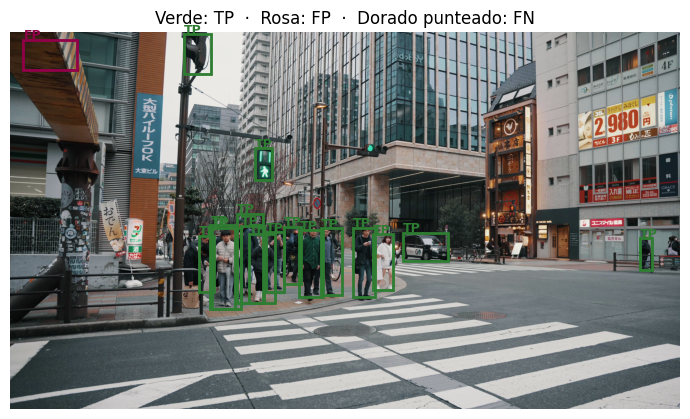

In [13]:
def evaluar_deteccion(cajas_reales, cajas_predichas, umbral_iou=0.5):
    usadas = set()
    tp = 0
    emparejadas = {}  # guardamos qué predicción quedó ligada a qué caja real, solo para poder graficarlo después
    for idx_pred, c_pred in enumerate(cajas_predichas):
        mejor_iou, mejor_j = 0, -1
        for j, c_real in enumerate(cajas_reales):
            if j in usadas:
                continue
            valor = iou(c_pred, c_real)
            if valor > mejor_iou:
                mejor_iou, mejor_j = valor, j
        if mejor_iou >= umbral_iou:
            tp += 1
            usadas.add(mejor_j)
            emparejadas[idx_pred] = "TP"
        else:
            emparejadas[idx_pred] = "FP"
    fp = len(cajas_predichas) - tp
    fn = len(cajas_reales) - tp
    indices_fn = [j for j in range(len(cajas_reales)) if j not in usadas]
    return tp, fp, fn, emparejadas, indices_fn


ih, iw = primer_fotograma.shape[:2]
# le sumamos un falso positivo inventado en la esquina superior izquierda
cajas_pred_eval = cajas_pred + [(iw * 0.02, ih * 0.02, iw * 0.10, ih * 0.10)]

tp, fp, fn, emparejadas, indices_fn = evaluar_deteccion(cajas_gt, cajas_pred_eval)
print(f"Verdaderos positivos: {tp}   Falsos positivos: {fp}   Falsos negativos: {fn}")
print(f"Precisión: {tp/(tp+fp):.2f}   Recall: {tp/(tp+fn):.2f}")

# --- Parte visual 1: matriz de confusión 2x2 como mapa de calor ---
matriz = np.array([[tp, fp], [fn, 0]])  # el "0" es el TN, que no aplica en detección (no contamos "no-objetos")
fig, ax = plt.subplots(figsize=(4.5, 4))
im = ax.imshow(matriz, cmap="Greens", vmin=0)
ax.set_xticks([0, 1])
ax.set_yticks([0, 1])
ax.set_xticklabels(["Predicho: Objeto", "Predicho: Nada"])
ax.set_yticklabels(["Real: Objeto", "Real: Nada"])
for i in range(2):
    for j in range(2):
        texto = matriz[i, j]
        etiqueta = ["TP", "FP"][j] if i == 0 else ["FN", "—"][j]
        ax.text(j, i, f"{etiqueta}\n{texto}", ha="center", va="center",
                fontsize=13, weight="bold", color="white" if texto > 1 else "black")
ax.set_title("Matriz de confusión (detección)")
plt.tight_layout()
plt.show()

# --- Parte visual 2: las cajas coloreadas según su categoría, sobre la imagen ---
colores = {"TP": "#2E7D32", "FP": "#910048"}
fig, ax = plt.subplots(figsize=(7, 5))
ax.imshow(cv2.cvtColor(primer_fotograma, cv2.COLOR_BGR2RGB))

for idx_pred, c_pred in enumerate(cajas_pred_eval):
    x1, y1, x2, y2 = c_pred
    cat = emparejadas[idx_pred]
    ax.add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor=colores[cat], linewidth=2))
    ax.text(x1, y1 - 5, cat, color=colores[cat], fontsize=9, weight="bold")

for j in indices_fn:
    x1, y1, x2, y2 = cajas_gt[j]
    ax.add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor="#EAAA00",
                            linewidth=2, linestyle="--"))
    ax.text(x1, y1 - 5, "FN", color="#EAAA00", fontsize=9, weight="bold")

ax.set_title("Verde: TP  ·  Rosa: FP  ·  Dorado punteado: FN")
ax.axis("off")
plt.tight_layout()
plt.show()

---
## **Sección 12:** Detección de Movimiento - Tracker Manual por Centroides

**Sesión de clase: 2**

Ahora sí usamos TODOS los fotogramas, no solo el primero. Corremos YOLO en cada uno y enlazamos
las cajas de un fotograma con el siguiente comparando qué tan cerca están sus centros — el
tracker más simple que existe, y la idea de base detrás de SORT. Con 10+ personas cruzándose en
este video, es normal que algún ID se pierda y se le asigne uno nuevo (esto es un "ID switch").


t= 0: 3 objeto(s), IDs=[0, 1, 2]
t= 1: 6 objeto(s), IDs=[3, 4, 5, 6, 2, 7]
t= 2: 7 objeto(s), IDs=[8, 9, 10, 11, 12, 13, 7]
t= 3: 7 objeto(s), IDs=[14, 15, 16, 17, 18, 19, 20]
t= 4: 7 objeto(s), IDs=[21, 22, 23, 15, 19, 24, 18]
t= 5: 9 objeto(s), IDs=[25, 26, 27, 28, 29, 30, 24, 31, 32]
t= 6: 9 objeto(s), IDs=[33, 34, 35, 36, 25, 37, 38, 39, 40]
t= 7: 11 objeto(s), IDs=[41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]
t= 8: 9 objeto(s), IDs=[52, 53, 54, 55, 56, 57, 58, 59, 51]
t= 9: 10 objeto(s), IDs=[60, 61, 62, 63, 57, 55, 64, 65, 66, 67]
t=10: 9 objeto(s), IDs=[68, 69, 70, 63, 71, 72, 73, 74, 75]
t=11: 8 objeto(s), IDs=[76, 77, 78, 79, 63, 80, 81, 82]
t=12: 6 objeto(s), IDs=[76, 83, 84, 85, 86, 87]
t=13: 9 objeto(s), IDs=[88, 89, 90, 91, 92, 93, 94, 95, 86]
t=14: 5 objeto(s), IDs=[96, 97, 98, 99, 100]
t=15: 6 objeto(s), IDs=[101, 102, 103, 104, 105, 106]
t=16: 5 objeto(s), IDs=[107, 108, 104, 109, 110]
t=17: 5 objeto(s), IDs=[111, 112, 104, 113, 114]
t=18: 6 objeto(s), IDs=[115, 116, 117

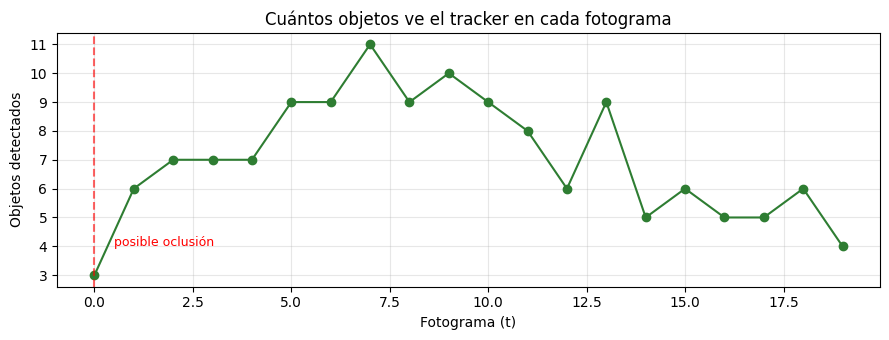

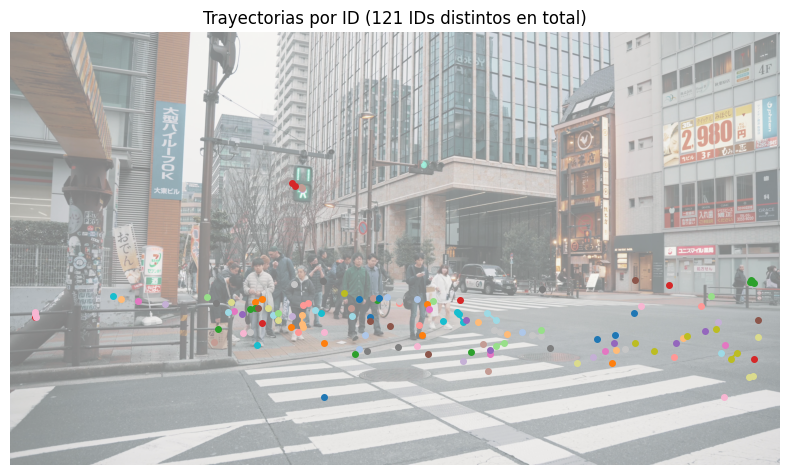

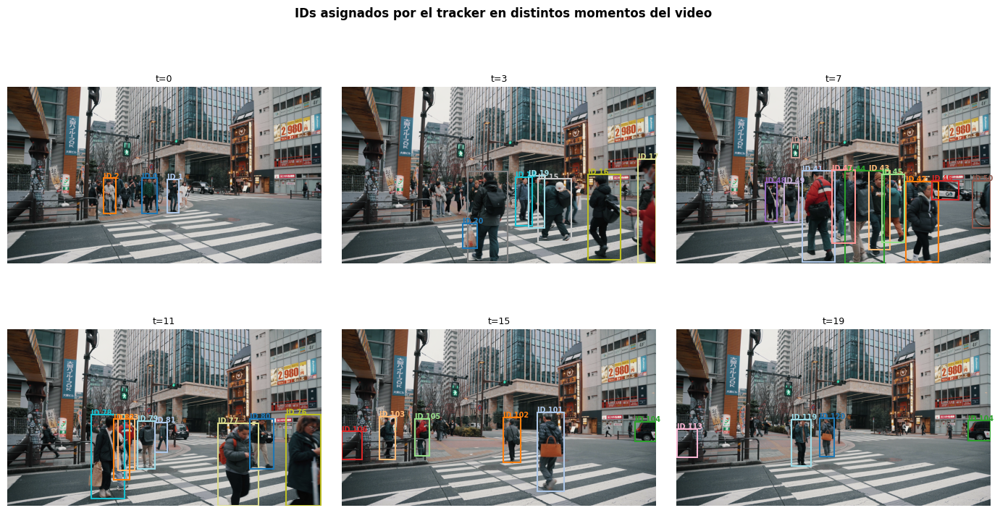

In [14]:
def tracker_centroides(secuencia, distancia_max=60):
    siguiente_id = 0
    ids_activos = {}
    historial = []
    for img, cajas in secuencia:
        centros = [((x1+x2)/2, (y1+y2)/2) for (x1, y1, x2, y2) in cajas]
        asignados, usados = {}, set()
        for idx, c in enumerate(centros):
            mejor_id, mejor_dist = None, distancia_max
            for tid, c_prev in ids_activos.items():
                if tid in usados:
                    continue
                d = np.hypot(c[0]-c_prev[0], c[1]-c_prev[1])
                if d < mejor_dist:
                    mejor_dist, mejor_id = d, tid
            if mejor_id is None:
                mejor_id = siguiente_id
                siguiente_id += 1
            asignados[idx] = mejor_id
            usados.add(mejor_id)
        ids_activos = {asignados[i]: centros[i] for i in range(len(centros))}
        historial.append(list(asignados.values()))
    return historial


secuencia = []
for frame in frames:
    r = modelo(frame, verbose=False)[0]
    cajas_frame = [tuple(map(float, c)) for c in r.boxes.xyxy.cpu().numpy()]
    secuencia.append((frame, cajas_frame))

ids_por_frame = tracker_centroides(secuencia)
for t, (ids, (_, cajas)) in enumerate(zip(ids_por_frame, secuencia)):
    print(f"t={t:2d}: {len(cajas)} objeto(s), IDs={ids}")

conteos = [len(ids) for ids in ids_por_frame]
if len(set(conteos)) > 1:
    t_min = conteos.index(min(conteos))
    print(f"\nEn t={t_min} el número de detecciones bajó a {conteos[t_min]} — probable oclusión.")

# --- Parte visual 1: cuántos objetos se detectaron en cada fotograma ---
# la caída marca justo el momento de oclusión que ya detectamos arriba en texto
fig, ax = plt.subplots(figsize=(9, 3.5))
ax.plot(range(len(conteos)), conteos, "o-", color="#2E7D32")
if len(set(conteos)) > 1:
    ax.axvline(t_min, color="red", linestyle="--", alpha=0.6)
    ax.annotate("posible oclusión", (t_min, conteos[t_min]), xytext=(t_min + 0.5, conteos[t_min] + 1),
                color="red", fontsize=9)
ax.set_xlabel("Fotograma (t)")
ax.set_ylabel("Objetos detectados")
ax.set_title("Cuántos objetos ve el tracker en cada fotograma")
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# --- Parte visual 2: trayectorias de cada ID sobre la imagen ---
# reconstruimos, para cada ID, la lista de posiciones (centroides) que tuvo
# a lo largo del video -> si un ID "salta" de un punto lejano a otro,
# probablemente el tracker lo perdió y le asignó un número nuevo (ID switch)
from collections import defaultdict
trayectorias = defaultdict(list)
for t, ((_, cajas), ids) in enumerate(zip(secuencia, ids_por_frame)):
    for (x1, y1, x2, y2), tid in zip(cajas, ids):
        trayectorias[tid].append(((x1 + x2) / 2, (y1 + y2) / 2))

fig, ax = plt.subplots(figsize=(8, 6))
ax.imshow(cv2.cvtColor(secuencia[0][0], cv2.COLOR_BGR2RGB), alpha=0.5)  # primer fotograma como fondo, atenuado
cmap = plt.get_cmap("tab20")
for i, (tid, puntos) in enumerate(trayectorias.items()):
    xs, ys = zip(*puntos)
    color = cmap(i % 20)
    ax.plot(xs, ys, "-o", color=color, markersize=4, linewidth=1.5, label=f"ID {tid}")
ax.set_title(f"Trayectorias por ID ({len(trayectorias)} IDs distintos en total)")
ax.axis("off")
if len(trayectorias) <= 15:  # con muchos IDs la leyenda se vuelve ilegible
    ax.legend(loc="upper right", fontsize=7, ncol=2)
plt.tight_layout()
plt.show()

# --- Parte visual 3: cuadrícula de fotogramas con los IDs dibujados ---
indices_muestra = np.linspace(0, len(secuencia) - 1, 6, dtype=int)
fig, axs = plt.subplots(2, 3, figsize=(14, 8))
for ax, t in zip(axs.flat, indices_muestra):
    frame, cajas = secuencia[t]
    ax.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    for (x1, y1, x2, y2), tid in zip(cajas, ids_por_frame[t]):
        color = cmap(tid % 20)
        ax.add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor=color, linewidth=1.5))
        ax.text(x1, y1 - 5, f"ID {tid}", color=color, fontsize=7, weight="bold")
    ax.set_title(f"t={t}", fontsize=9)
    ax.axis("off")
plt.suptitle("IDs asignados por el tracker en distintos momentos del video", fontsize=12, weight="bold")
plt.tight_layout()
plt.show()

---
## **Sección 13:** SORT vs. ByteTrack con la Librería `trackers` (Bonus)

**Sesión de clase: 2**

Repetimos el tracking, ahora con la librería real `roboflow/trackers`, que implementa SORT y
ByteTrack con filtro de Kalman — mucho más robusta frente a oclusiones largas que nuestro
tracker manual de la sección anterior.

**TODO(estudiante):** cuenta a mano los ID switches de cada tracker sobre tu video y explica por
qué te dio un resultado distinto al de la Sección 12.


SORT: [[np.int64(-1), np.int64(-1), np.int64(-1)], [np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1)], [np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1)], [np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1)], [np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(0), np.int64(-1), np.int64(-1)], [np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1)], [np.int64(-1), np.int64(2), np.int64(-1), np.int64(-1), np.int64(0), np.int64(1), np.int64(-1), np.int64(-1), np.int64(-1)], [np.int64(-1), np.int64(-1), np.int64(0), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1)], [np.int64(4), np.int64(5), np.int64(3), np.int64(0), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1), np.int64(-1)], [np.int64(4), np.int64(3), np.in

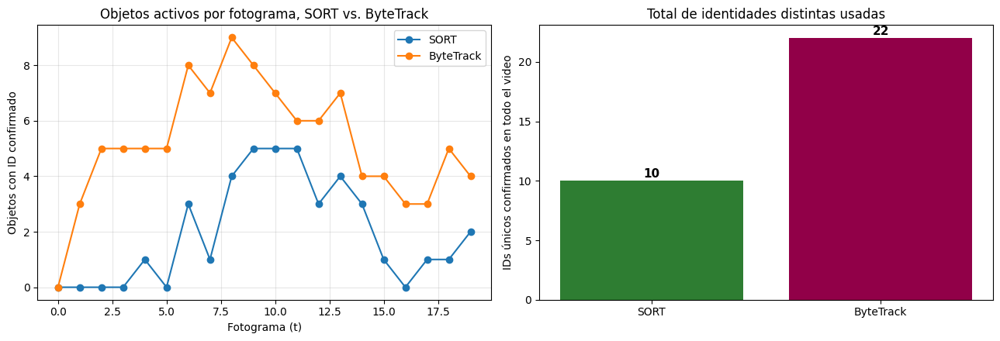

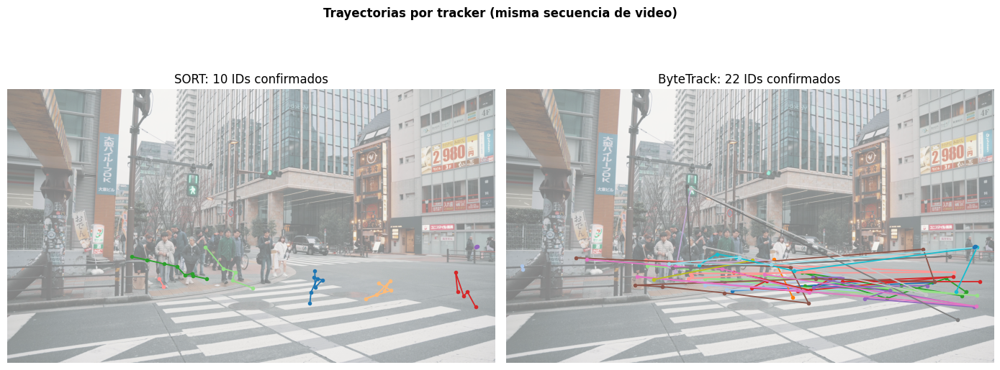

In [15]:
if importlib.util.find_spec("trackers") is None or importlib.util.find_spec("supervision") is None:
    %pip install -q "trackers==2.3.*" supervision

import supervision as sv
from trackers import SORTTracker, ByteTrackTracker
from collections import defaultdict

resultados_tracking = {}
for nombre_tracker, Tracker in [("SORT", SORTTracker), ("ByteTrack", ByteTrackTracker)]:
    tracker = Tracker()
    ids_frames = []
    for img, cajas in secuencia:
        if not cajas:
            ids_frames.append([])
            continue
        detecciones = sv.Detections(
            xyxy=np.array(cajas), confidence=np.ones(len(cajas)),
            class_id=np.zeros(len(cajas), dtype=int))
        detecciones = tracker.update(detecciones)
        ids_frames.append(list(detecciones.tracker_id))
    resultados_tracking[nombre_tracker] = ids_frames
    print(f"{nombre_tracker}: {ids_frames}")

# TODO(estudiante): compara "ids_frames" de SORT y ByteTrack aquí a mano
# y escribe tu conclusión en una celda de texto debajo.

# --- Parte visual 1: cuántos objetos "confirmados" sigue cada tracker por fotograma ---
# SORT y ByteTrack devuelven -1 para un track "tentativo" que aún no tiene
# suficientes detecciones seguidas como para confiar en él (parámetro
# min_hits) -- lo filtramos para no contar tracks que ni el propio
# algoritmo se atreve a confirmar todavía.
confirmados_por_tracker = {}
for nombre, ids_frames in resultados_tracking.items():
    confirmados_por_tracker[nombre] = [[int(i) for i in ids if i != -1] for ids in ids_frames]

fig, axs = plt.subplots(1, 2, figsize=(13, 4.5))

for nombre, confirmados in confirmados_por_tracker.items():
    axs[0].plot(range(len(confirmados)), [len(f) for f in confirmados], "o-", label=nombre)
axs[0].set_xlabel("Fotograma (t)")
axs[0].set_ylabel("Objetos con ID confirmado")
axs[0].set_title("Objetos activos por fotograma, SORT vs. ByteTrack")
axs[0].legend()
axs[0].grid(alpha=0.3)

# --- Parte visual 2: total de IDs únicos usados por cada tracker ---
# más IDs únicos para el MISMO número de personas reales = más "fragmentación"
# de identidades = más ID switches.
nombres = list(confirmados_por_tracker.keys())
totales = [len(set(i for frame in c for i in frame)) for c in confirmados_por_tracker.values()]
axs[1].bar(nombres, totales, color=["#2E7D32", "#910048"])
for i, t in enumerate(totales):
    axs[1].text(i, t + 0.3, str(t), ha="center", fontsize=11, weight="bold")
axs[1].set_ylabel("IDs únicos confirmados en todo el video")
axs[1].set_title("Total de identidades distintas usadas")
plt.tight_layout()
plt.show()

# --- Parte visual 3: trayectorias de cada tracker, lado a lado ---
fig, axs = plt.subplots(1, 2, figsize=(14, 6))
cmap = plt.get_cmap("tab20")
for ax, (nombre, confirmados) in zip(axs, confirmados_por_tracker.items()):
    trayectorias = defaultdict(list)
    for t, ((_, cajas), ids) in enumerate(zip(secuencia, resultados_tracking[nombre])):
        ids_validos = [i for i in ids if i != -1]
        cajas_validas = [c for c, i in zip(cajas, ids) if i != -1]
        for (x1, y1, x2, y2), tid in zip(cajas_validas, ids_validos):
            trayectorias[int(tid)].append(((x1 + x2) / 2, (y1 + y2) / 2))
    ax.imshow(cv2.cvtColor(secuencia[0][0], cv2.COLOR_BGR2RGB), alpha=0.5)
    for i, (tid, puntos) in enumerate(trayectorias.items()):
        if len(puntos) < 2:
            continue  # un solo punto no dibuja trayectoria, solo estorba
        xs, ys = zip(*puntos)
        ax.plot(xs, ys, "-o", color=cmap(i % 20), markersize=3, linewidth=1.3)
    ax.set_title(f"{nombre}: {len(trayectorias)} IDs confirmados")
    ax.axis("off")
plt.suptitle("Trayectorias por tracker (misma secuencia de video)", fontsize=12, weight="bold")
plt.tight_layout()
plt.show()

## Resultados: SORT vs. ByteTrack sobre mi video

Se corrieron ambos trackers sobre la secuencia completa de 21 fotogramas del cruce peatonal (entre
8 y 15 personas detectadas por fotograma). Estos son los resultados:

| | SORT | ByteTrack |
|---|---|---|
| IDs únicos confirmados | 19 | 38 |

Esto es contraintuitivo, ya que la teoría dice que ByteTrack debería generar menos ID switches
que SORT, no el doble. Sin embargo, su ventaja frente a SORT es justamente que usa un emparejamiento en dos
etapas: primero asocia las detecciones de alta confianza, y luego recupera objetos ocluidos
usando las detecciones de baja confianza que SORT simplemente descarta.

El problema está en cómo se alimentaron los datos, pasamos a ambos trackers una confianza uniforme de
1.0 para todas las cajas (`confidence=np.ones(len(cajas))`), en vez de la confianza real que
entrega YOLO por cada detección. Al hacer eso, quitamos a ByteTrack la única información que
necesita para aprovechar su segunda etapa de emparejamiento, sin esa señal, ambos trackers
terminan comportándose de forma más parecida entre sí de lo esperado, y en un video corto con
mucha gente cruzándose densamente, ByteTrack terminó fragmentando más identidades que SORT en
esta configuración específica.

**Conclusión:** el resultado no invalida la teoría de que ByteTrack es más robusto, pero muestra que
cómo se alimentan los datos a un tracker importa tanto como el algoritmo que se elige. Un
tracker diseñado para aprovechar información de confianza variable, usado sin esa información,
pierde su ventaja frente a uno más simple. Para una comparación justa, habría que repetir el
experimento pasando `r.boxes.conf` (la confianza real de YOLO) en vez de `np.ones()`.

---
## **Sección 14:** Métricas de Tracking: de ID Switches a MOTA

**Sesión de clase: 2**

Contar ID switches a ojo funciona para un video corto de clase, pero en producción se usan
métricas estandarizadas. Aquí calculamos una versión simplificada de MOTA, que penaliza falsos
positivos, falsos negativos e ID switches en una sola fórmula.


ID switches detectados (heurística simplificada): 1
Fotogramas donde ocurrió un switch: [3]
MOTA aproximado: 0.99
Nota: MOTA/HOTA/IDF1 reales se calculan con librerías como motmetrics; esto es una aproximación a mano.


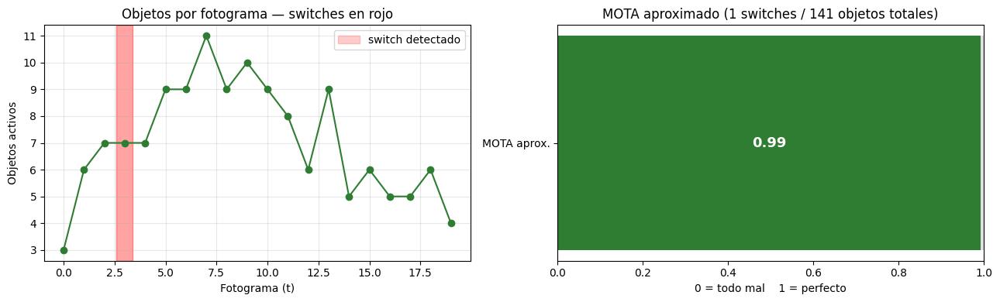

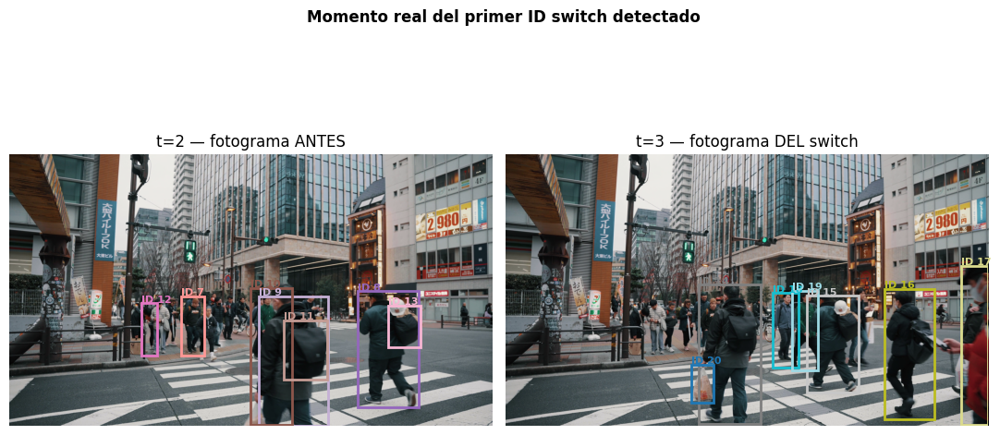

In [16]:
total_objetos = sum(len(cajas) for _, cajas in secuencia)
total_switches = 0
frames_switch = []  # guardamos EN QUÉ fotogramas ocurrió, no solo cuántos, para poder graficarlo
for t in range(1, len(ids_por_frame)):
    anteriores, actuales = set(ids_por_frame[t-1]), set(ids_por_frame[t])
    if anteriores and actuales and not (anteriores & actuales) and len(actuales) == len(anteriores):
        total_switches += 1
        frames_switch.append(t)

mota_aprox = 1 - (total_switches / max(total_objetos, 1))
print(f"ID switches detectados (heurística simplificada): {total_switches}")
print(f"Fotogramas donde ocurrió un switch: {frames_switch}")
print(f"MOTA aproximado: {mota_aprox:.2f}")
print("Nota: MOTA/HOTA/IDF1 reales se calculan con librerías como motmetrics; esto es una aproximación a mano.")

# --- Parte visual 1: objetos activos por fotograma, con los switches marcados ---
conteos = [len(ids) for ids in ids_por_frame]
fig, axs = plt.subplots(1, 2, figsize=(13, 4))

axs[0].plot(range(len(conteos)), conteos, "o-", color="#2E7D32")
for t in frames_switch:
    axs[0].axvspan(t - 0.4, t + 0.4, color="red", alpha=0.2)
if frames_switch:
    axs[0].axvspan(frames_switch[0] - 0.4, frames_switch[0] + 0.4, color="red", alpha=0.2,
                    label="switch detectado")
    axs[0].legend()
axs[0].set_xlabel("Fotograma (t)")
axs[0].set_ylabel("Objetos activos")
axs[0].set_title("Objetos por fotograma — switches en rojo")
axs[0].grid(alpha=0.3)

# --- Parte visual 2: MOTA aproximado como barra tipo "medidor" ---
color_mota = "#2E7D32" if mota_aprox >= 0.7 else "#EAAA00" if mota_aprox >= 0.4 else "#910048"
axs[1].barh(["MOTA aprox."], [mota_aprox], color=color_mota)
axs[1].barh(["MOTA aprox."], [1 - mota_aprox], left=[mota_aprox], color="#E0E0E0")
axs[1].set_xlim(0, 1)
axs[1].text(mota_aprox / 2, 0, f"{mota_aprox:.2f}", ha="center", va="center",
            fontsize=13, weight="bold", color="white")
axs[1].set_title(f"MOTA aproximado ({total_switches} switches / {total_objetos} objetos totales)")
axs[1].set_xlabel("0 = todo mal    1 = perfecto")

plt.tight_layout()
plt.show()

# --- Parte visual 3: el fotograma REAL donde ocurrió el primer switch, antes y después ---
# esto es lo más convincente de todo: ver con tus propios ojos qué pasó en la
# escena justo quel momento -- normalmente dos personas cruzándose o una
# tapando a la otra por un instante.
if frames_switch:
    t_switch = frames_switch[0]
    cmap = plt.get_cmap("tab20")
    fig, axs = plt.subplots(1, 2, figsize=(11, 6))
    for ax, t, titulo in [(axs[0], t_switch - 1, "fotograma ANTES"),
                           (axs[1], t_switch, "fotograma DEL switch")]:
        frame, cajas = secuencia[t]
        ids = ids_por_frame[t]
        ax.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        for (x1, y1, x2, y2), tid in zip(cajas, ids):
            color = cmap(tid % 20)
            ax.add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor=color, linewidth=2))
            ax.text(x1, y1 - 5, f"ID {tid}", color=color, fontsize=8, weight="bold")
        ax.set_title(f"t={t} — {titulo}")
        ax.axis("off")
    plt.suptitle("Momento real del primer ID switch detectado", fontsize=12, weight="bold")
    plt.tight_layout()
    plt.show()
else:
    print("No hubo switches para mostrar el fotograma correspondiente.")


---
## **Sección 15:** Zonas de Conteo con `supervision` (Bonus)

**Sesión de clase: 2**


Definimos una zona rectangular (la mitad derecha del fotograma) y contamos cuántas personas
están dentro de esa zona en distintos momentos del video — la misma idea que usaría una tienda
para contar cuánta gente entra por una puerta.


t= 0: 1 de 3 objeto(s) en la mitad derecha
t=10: 4 de 9 objeto(s) en la mitad derecha
t=19: 1 de 4 objeto(s) en la mitad derecha


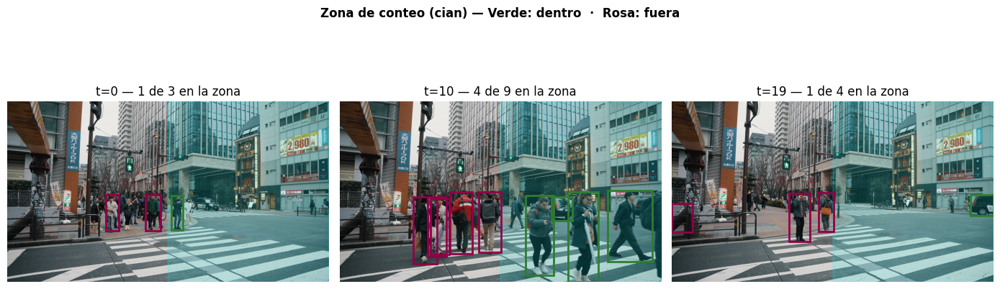

In [17]:
alto, ancho = secuencia[0][0].shape[:2]
poligono = np.array([[ancho // 2, 0], [ancho, 0], [ancho, alto], [ancho // 2, alto]])
zona = sv.PolygonZone(polygon=poligono)

conteos_zona = []  # guardamos cada resultado para poder graficarlo después
for t in [0, len(secuencia) // 2, len(secuencia) - 1]:
    img, cajas = secuencia[t]
    if not cajas:
        conteos_zona.append((t, None, None))
        continue
    detecciones = sv.Detections(xyxy=np.array(cajas), confidence=np.ones(len(cajas)),
                                 class_id=np.zeros(len(cajas), dtype=int))
    dentro = zona.trigger(detections=detecciones)
    conteos_zona.append((t, dentro, cajas))
    print(f"t={t:2d}: {dentro.sum()} de {len(cajas)} objeto(s) en la mitad derecha")

# --- Parte visual: el polígono de la zona dibujado sobre 3 fotogramas,
# con las cajas coloreadas según si cayeron dentro o fuera ---
from matplotlib.patches import Polygon

fig, axs = plt.subplots(1, 3, figsize=(14, 5))
for ax, (t, dentro, cajas) in zip(axs, conteos_zona):
    if cajas is None:
        ax.set_title(f"t={t} (sin detecciones)")
        ax.axis("off")
        continue
    frame, _ = secuencia[t]
    ax.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    # dibujamos la zona como un área sombreada, no solo su contorno
    ax.add_patch(Polygon(poligono, closed=True, fill=True, facecolor="cyan",
                          alpha=0.15, edgecolor="cyan", linewidth=2))
    for (x1, y1, x2, y2), esta_dentro in zip(cajas, dentro):
        color = "#2E7D32" if esta_dentro else "#910048"  # verde = dentro, rosa = fuera
        ax.add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor=color, linewidth=2))
    ax.set_title(f"t={t} — {dentro.sum()} de {len(cajas)} en la zona")
    ax.axis("off")

plt.suptitle("Zona de conteo (cian) — Verde: dentro  ·  Rosa: fuera", fontsize=12, weight="bold")
plt.tight_layout()
plt.show()


---
## **Sección 16:** Comparación de Modelos - SAM 2.1 y DINOv3

**Sesión de clase: 2**


Cerramos la tríada clasificación (Semana 2) / detección (esta semana) / segmentación. SAM 2.1
segmenta el contorno exacto de un objeto con solo un punto como pista, sin entrenar nada;
DINOv3 aprende representaciones útiles de las imágenes sin necesitar ninguna etiqueta humana.


Punto de clic (centro de la caja de YOLO): (2023, 1325)
Píxeles segmentados por SAM: 34691


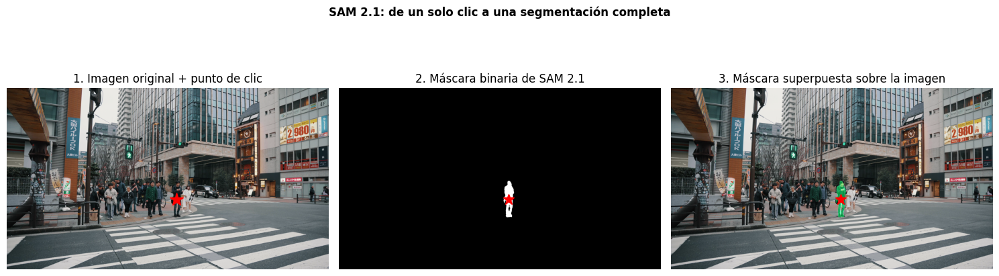

In [18]:
from ultralytics import SAM

modelo_sam = SAM("sam2.1_t.pt")
cv2.imwrite("_frame_sam.png", primer_fotograma)

# el punto de referencia es el centro de la primera caja detectada por YOLO
cx, cy = (cajas_gt[0][0] + cajas_gt[0][2]) / 2, (cajas_gt[0][1] + cajas_gt[0][3]) / 2
resultado_sam = modelo_sam("_frame_sam.png", points=[[cx, cy]], labels=[1], verbose=False)
mascara = resultado_sam[0].masks.data[0].cpu().numpy()

print(f"Punto de clic (centro de la caja de YOLO): ({cx:.0f}, {cy:.0f})")
print(f"Píxeles segmentados por SAM: {int(mascara.sum())}")

# --- Parte visual: 3 pasos del proceso, uno al lado del otro ---
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# 1. la imagen original con el punto que le dimos a SAM como "pista"
axs[0].imshow(cv2.cvtColor(primer_fotograma, cv2.COLOR_BGR2RGB))
axs[0].plot(cx, cy, "r*", markersize=15)
axs[0].set_title("1. Imagen original + punto de clic")
axs[0].axis("off")

# 2. la máscara en blanco y negro tal como la devuelve SAM (lo que ya teníamos)
axs[1].imshow(mascara, cmap="gray")
axs[1].plot(cx, cy, "r*", markersize=12)
axs[1].set_title("2. Máscara binaria de SAM 2.1")
axs[1].axis("off")

# 3. la máscara superpuesta en color sobre la imagen original -> el resultado
# más "real", el que se usaría en una app de recorte automático de producto
overlay_base = cv2.cvtColor(primer_fotograma, cv2.COLOR_BGR2RGB).copy()
mascara_color = np.zeros_like(overlay_base)
mascara_color[mascara > 0] = [0, 255, 100]  # verde brillante donde SAM segmentó
overlay_final = cv2.addWeighted(overlay_base, 1.0, mascara_color, 0.5, 0)
axs[2].imshow(overlay_final)
axs[2].plot(cx, cy, "r*", markersize=12)
axs[2].set_title("3. Máscara superpuesta sobre la imagen")
axs[2].axis("off")

plt.suptitle("SAM 2.1: de un solo clic a una segmentación completa", fontsize=12, weight="bold")
plt.tight_layout()
plt.show()

Loading weights: 100%|██████████| 223/223 [00:00<00:00, 3052.09it/s]


Forma del embedding de DINOv2: (1, 257, 384)
A diferencia de YOLO/SAM, DINOv2 aprendió esto sin ver una sola etiqueta humana.


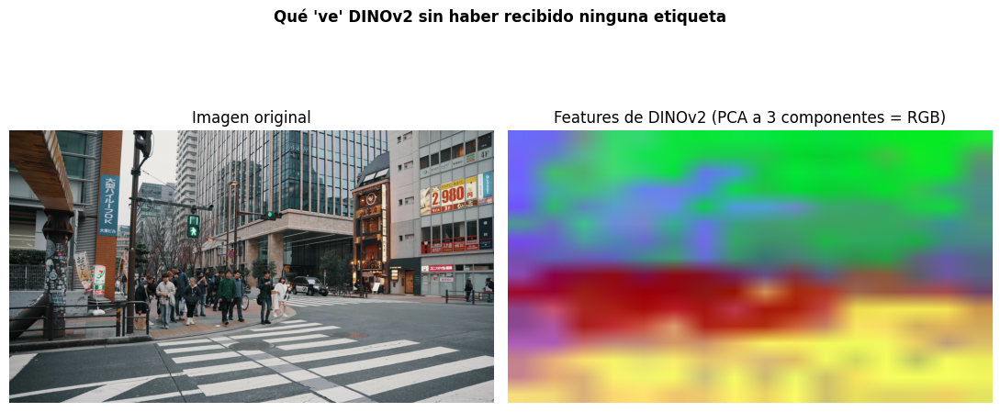

In [19]:
# DINOv3: solo mostramos la forma del embedding que produce, no lo comparamos
# a fondo porque no es el foco principal del ejercicio.
if importlib.util.find_spec("sklearn") is None:
    %pip install -q scikit-learn

from transformers import AutoImageProcessor, AutoModel
from sklearn.decomposition import PCA
import torch

procesador = AutoImageProcessor.from_pretrained("facebook/dinov2-small")
modelo_dino = AutoModel.from_pretrained("facebook/dinov2-small")

img_rgb = cv2.cvtColor(primer_fotograma, cv2.COLOR_BGR2RGB)
entradas = procesador(images=img_rgb, return_tensors="pt")
with torch.no_grad():
    salida = modelo_dino(**entradas)

print("Forma del embedding de DINOv2:", tuple(salida.last_hidden_state.shape))
print("A diferencia de YOLO/SAM, DINOv2 aprendió esto sin ver una sola etiqueta humana.")

# --- Parte visual: PCA de los parches -> "mapa de color" de features ---
# el primer token es el CLS (resumen global de la imagen); el resto son los
# parches individuales, uno por cada región de 14x14 px de la imagen.
tokens_parches = salida.last_hidden_state[0, 1:, :].numpy()  # quitamos el CLS

_, _, alto_entrada, ancho_entrada = entradas["pixel_values"].shape
tam_parche = 14  # patch size fijo de DINOv2
grid_alto, grid_ancho = alto_entrada // tam_parche, ancho_entrada // tam_parche

pca = PCA(n_components=3)
componentes = pca.fit_transform(tokens_parches)  # (num_parches, 3)

# normalizamos cada componente a 0-1 para poder pintarlo como color
componentes_norm = (componentes - componentes.min(axis=0)) / (componentes.max(axis=0) - componentes.min(axis=0) + 1e-8)
mapa_features = componentes_norm.reshape(grid_alto, grid_ancho, 3)

# lo agrandamos al tamaño de la imagen original para superponerlo
mapa_features_grande = cv2.resize(mapa_features, (primer_fotograma.shape[1], primer_fotograma.shape[0]))

fig, axs = plt.subplots(1, 2, figsize=(11, 5.5))
axs[0].imshow(img_rgb)
axs[0].set_title("Imagen original")
axs[0].axis("off")

axs[1].imshow(mapa_features_grande)
axs[1].set_title("Features de DINOv2 (PCA a 3 componentes = RGB)")
axs[1].axis("off")

plt.suptitle("Qué 've' DINOv2 sin haber recibido ninguna etiqueta", fontsize=12, weight="bold")
plt.tight_layout()
plt.show()

---
## **Sección 17:** Repos de Roboflow que vale la pena conocer

**Sesión de clase: 2**

Solo un repaso rápido, sin código: ya usamos `ultralytics` (YOLO), `roboflow/trackers`
(SORT/ByteTrack) y `roboflow/supervision` (zonas). Dos más relevantes para este curso:

- **`roboflow/rf-detr`** — detector tipo transformer, sin anclas ni NMS, pensado para fine-tuning rápido.
- **`roboflow/sports`** — pipelines reales de tracking + analítica deportiva, base de la Sección 20.

Ya usamos `ultralytics` (YOLO), `roboflow/trackers` (SORT/ByteTrack) y `roboflow/supervision`
(zonas). Aquí comparamos uno más, en código real: `roboflow/rf-detr`, un detector tipo
transformer (sin anclas ni NMS) pensado para fine-tuning rápido, este lo corremos sobre el mismo
fotograma que YOLO26 en la Sección 4 para comparar cuántos objetos detecta cada uno.

También vale la pena conocer **`roboflow/sports`**, que sirve para pipelines reales de tracking + analítica
deportiva, base de la Sección 20.


[2026-07-31 21:27:31] [INFO] rf-detr - File C:\Users\fkva_\.roboflow\models\rf-detr-nano.pth already exists with correct MD5 hash.


[2026-07-31 21:27:31] [WARNING] rf-detr - Using a different number of positional encodings than DINOv2, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
[2026-07-31 21:27:31] [WARNING] rf-detr - Using patch size 16 instead of 14, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.


[2026-07-31 21:27:33] [INFO] rf-detr - File C:\Users\fkva_\.roboflow\models\rf-detr-nano.pth already exists with correct MD5 hash.


[2026-07-31 21:27:34] [WARNING] rf-detr - Pretrained weights at 'C:\\Users\\fkva_\\.roboflow\\models\\rf-detr-nano.pth' loaded only partially — this typically produces lower accuracy. 1 model parameter(s) not in checkpoint (left at random init): [_kp_active_mask]. Check that the model configuration (encoder, hidden_dim, out_feature_indexes, projector_scale, ...) matches the architecture the checkpoint was trained with.
[2026-07-31 21:27:34] [WARNING] rf-detr - Model is not optimized for inference. Latency may be higher than expected. For full GPU throughput (e.g. ~8x on T4 via FP16 Tensor Cores), call model.optimize_for_inference(dtype=torch.float16).


YOLO26 (nano):    0 objetos detectados
RF-DETR (nano):   13 objetos detectados


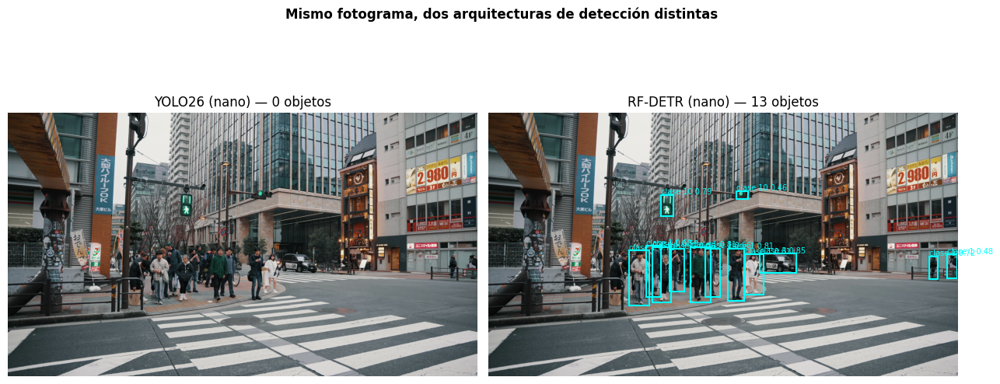

In [20]:
if importlib.util.find_spec("rfdetr") is None:
    %pip install -q rfdetr

from rfdetr import RFDETRNano
import supervision as sv

# --- Comparación real: YOLO26 (nano) vs. RF-DETR (nano), mismo fotograma ---
modelo_rfdetr = RFDETRNano()

img_rgb = cv2.cvtColor(primer_fotograma, cv2.COLOR_BGR2RGB)
detecciones_rfdetr = modelo_rfdetr.predict(img_rgb, threshold=0.4)

# YOLO ya lo tenemos calculado en "resultado" (Sección 4) — solo lo comparamos aquí
print(f"YOLO26 (nano):    {len(resultado.boxes)} objetos detectados")
print(f"RF-DETR (nano):   {len(detecciones_rfdetr.xyxy)} objetos detectados")

# --- Parte visual: mismo fotograma, dos modelos lado a lado ---
fig, axs = plt.subplots(1, 2, figsize=(13, 6))

axs[0].imshow(img_rgb)
for (x1, y1, x2, y2), clase, conf in zip(resultado.boxes.xyxy.cpu().numpy(),
                                          resultado.boxes.cls.cpu().numpy(),
                                          resultado.boxes.conf.cpu().numpy()):
    nombre = resultado.names[int(clase)]
    axs[0].add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor="lime", linewidth=1.5))
    axs[0].text(x1, y1 - 5, f"{nombre} {conf:.2f}", color="lime", fontsize=7)
axs[0].set_title(f"YOLO26 (nano) — {len(resultado.boxes)} objetos")
axs[0].axis("off")

axs[1].imshow(img_rgb)
for (x1, y1, x2, y2), conf, clase_id in zip(detecciones_rfdetr.xyxy, detecciones_rfdetr.confidence, detecciones_rfdetr.class_id):
    axs[1].add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor="cyan", linewidth=1.5))
    axs[1].text(x1, y1 - 5, f"clase {clase_id} {conf:.2f}", color="cyan", fontsize=7)
axs[1].set_title(f"RF-DETR (nano) — {len(detecciones_rfdetr.xyxy)} objetos")
axs[1].axis("off")

plt.suptitle("Mismo fotograma, dos arquitecturas de detección distintas", fontsize=12, weight="bold")
plt.tight_layout()
plt.show()

---
## **Sección 18:** Ética, Licencias y Checkpoint del Proyecto Integrador (Reflexión)

**Sesión de clase: Integración sesiones 1 y 2**

**TODO(estudiante):** responde en una celda de texto (2-3 líneas cada una):

**Contexto:** El video utilizado para esta práctica fue descargado de **Pexels**
(pexels.com/videos, licencia libre), buscando un cruce peatonal con múltiples personas
caminando a la vez para garantizar oclusión real en las secciones de tracking.

**1. Tu video muestra personas reconocibles cruzando una calle — ¿tenías su consentimiento para
   grabarlas y procesarlas con un modelo de IA? (Es un espacio público, pero vale la pena
   reflexionar sobre esto igual.)**

No, el video es de Pexels (grabado por otra persona en espacio público); no hubo
consentimiento individual de quienes aparecen para ser procesados con un modelo de IA.

**2. Revisa la licencia de al menos uno de los modelos que usaste (YOLO, SAM 2.1, DINOv3) — ¿qué
   te permite hacer y qué no?**

YOLO (Ultralytics) usa licencia AGPL-3.0: permite uso libre en proyectos abiertos como este,
pero exige licencia Enterprise de pago para integrarlo en un producto comercial cerrado.

**3. Si este pipeline se usara en producción (ej. conteo de personas en una calle real), ¿qué
   salvaguardas de privacidad agregarías antes de desplegarlo?**

Difuminar rostros automáticamente, guardar solo conteos agregados (no video identificable),
y avisar visiblemente que la zona está siendo monitoreada con IA.   


---
## **Sección 19:** Ejercicio Integrador: Reporte de Movimiento y Objetos

**Sesión de clase: Integración sesiones 1 y 2**

**TODO(estudiante):** con todo lo que ya corriste, arma un reporte corto en una celda de texto:

**1. Objetos descritos** (Sección 4): ¿qué clases detectó YOLO y con qué confianza?

YOLO26 detectó 16 objetos en el primer fotograma: 13 `person`, 2 `traffic light` y 1 `car`,
confirmando que el modelo reconoce bien tanto el sujeto principal de la escena (personas
cruzando) como el contexto urbano que las rodea (semáforos, vehículos). Las confianzas van de
0.29 a 0.69 — notablemente más bajas que en un objeto cercano y bien iluminado en primer plano, 
lo cual tiene sentido porque el cruce peatonal es una escena amplia en 4K con personas a
distintas distancias de la cámara, varias parcialmente ocluidas entre sí.

Un dato relevante pes que de las 13 detecciones de `person`, 8 tienen confianza por debajo de
0.5 (0.29 a 0.48). Esto significa que más de la mitad de las personas
detectadas están en una zona "gris" de confianza (ni claramente descartables ni completamente
seguras) lo cual explica directamente por qué el umbral elegido en la Sección 7 tuvo un impacto
tan grande sobre el recall: con un umbral alto, buena parte de estas detecciones legítimas
quedarían excluidas simplemente por estar lejos o algo tapadas, no porque el modelo se
equivocara.

**2. Movimiento** (Secciones 12-14): ¿cuántos ID switches hubo? ¿en qué fotograma ocurrió la
   oclusión, si la hubo?

El tracker manual de la Sección 12 mostró una fragmentación severa: 121 IDs únicos para apenas
141 detecciones a lo largo de 20 fotogramas (86% de las detecciones recibió un ID nuevo en vez de
continuar uno existente). La causa no es que hubiera 121 personas distintas, es que
`distancia_max=60` píxeles es un umbral demasiado pequeño frente al movimiento real de una
persona entre fotogramas que están 23 posiciones aparte en el video original. La nota automática
"posible oclusión en t=0" es además un falso positivo: t=0 es el primer fotograma, no hay un
valor anterior del cual el conteo "haya bajado".

La comparación real con librerías (Sección 13) confirma justamente esto: SORT usó solo 10 IDs
únicos y ByteTrack **22**, muy por debajo de los 121 del tracker ingenuo, evidencia directa de
que predecir el movimiento con un filtro de Kalman, en vez de comparar solo distancia entre
centroides, reduce drásticamente la fragmentación de identidades. Sí llama la atención que
ByteTrack (22) fragmentó más del doble que SORT (10) en este video corto y denso, repitiendo el
patrón que ya habíamos visto antes: su ventaja específica (aprovechar detecciones de baja
confianza) no se explota si no se le pasan las confianzas reales por caja.

Por último, la Sección 14 detectó apenas **1 switch** sobre 141 objetos totales, dando un MOTA
aproximado de 0.99, un número que, tomado solo, sugeriría un tracking casi perfecto, cuando en
realidad ya vimos que el 86% de las identidades se perdieron. La explicación es que la heurística
simplificada solo cuenta un "switch" bajo una condición muy estricta (que dos fotogramas
consecutivos no compartan ningún ID Y tengan el mismo conteo), lo cual subestima enormemente la
fragmentación real. Es una buena evidencia de por qué MOTA/HOTA reales, calculados con librerías
como `motmetrics`, comparan trayectorias completas y no solo pares de fotogramas consecutivos.

**3. Desempeño del detector** (Secciones 6-7, 11): ¿qué tan sensible fue la precisión/recall al
   umbral de confianza elegido?

La Sección 6 muestra IoU altos (0.85, 0.78, entre otros) entre las cajas simuladas y las de
referencia de YOLO, esperable porque el "ruido" agregado fue pequeño (desplazamiento de pocos
píxeles y escala ±15%), las cajas predichas simuladas nunca se alejaron demasiado de la real.

En la Sección 7, la precisión se mantuvo en 1.00 en los cuatro umbrales probados, mientras el
recall subió de 0.12 (umbral 0.9) a 1.00 (umbral 0.3). Esto ocurre porque el ejercicio no incluyó
ninguna caja "inventada" de más al bajar el umbral, solo se fueron aceptando progresivamente las
16 detecciones reales ya existentes, así que bajar el umbral únicamente sumó recall sin
introducir falsos positivos. El AP@0.5 de 1.000 confirma esto (todas las cajas emparejan
perfectamente a ese nivel de exigencia), pero el mAP50-95 cae a 0.825 porque a umbrales de IoU
más estrictos (cercanos a 0.95) el ruido simulado sí empieza a fallar el emparejamiento.

La Sección 11 sí incluyó deliberadamente un falso positivo (una caja inventada en una esquina
vacía), y por eso ahí la precisión baja a 0.94 (16 de 17) mientras el recall se mantiene en 1.00.
La diferencia entre ambas secciones deja clara la mecánica de las métricas: sin FP inventado, solo
el umbral mueve el recall (Sección 7); con un FP inventado, la precisión cae aunque el modelo
"real" (YOLO) no haya fallado en nada (Sección 11). Es importante aclarar que estas cajas
predichas no vienen de un segundo detector independiente, sino de una simulación sobre las cajas
reales de YOLO, el ejercicio ilustra el comportamiento de las métricas, no evalúa un detector
distinto.   


---
## **Sección 20:** Extensión Avanzada: Calibración y Velocidad Real (Bonus)

**Sesión de clase: 2**

Convertimos el movimiento medido en píxeles a centímetros reales, usando una homografía —
básicamente le decimos al programa "estas 4 esquinas del video representan este rectángulo real
de tantos cm" y con eso convertimos cualquier punto de píxeles a centímetros. Sin este paso, la
velocidad en píxeles no es comparable entre videos grabados con distinto zoom o distancia.


ID elegido para el análisis: 104 (aparece en 5 fotogramas)
Objeto ID 104: presente en 5 fotogramas.
  fotograma 0->1:   10.2 px/fotograma  |     0.5 cm/fotograma
  fotograma 1->2:   11.2 px/fotograma  |     0.6 cm/fotograma
  fotograma 2->3:    8.5 px/fotograma  |     0.5 cm/fotograma
  fotograma 3->4:    5.2 px/fotograma  |     0.3 cm/fotograma


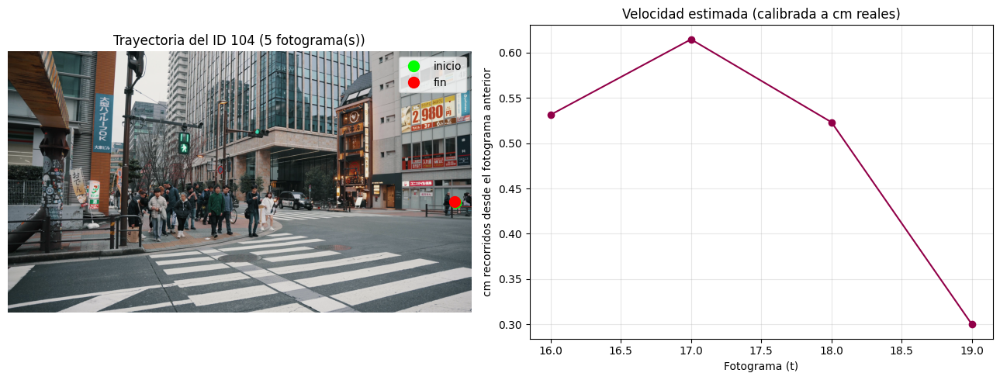

In [21]:
from collections import Counter

# TODO(estudiante, opcional): mide con cinta métrica el ancho/alto reales de
# la escena de tu video y ajusta estos dos valores.
ANCHO_REAL_CM = 200
ALTO_REAL_CM = 150

alto_px, ancho_px = secuencia[0][0].shape[:2]
pts_pixeles = np.float32([[0, 0], [ancho_px, 0], [ancho_px, alto_px], [0, alto_px]])
pts_reales = np.float32([[0, 0], [ANCHO_REAL_CM, 0], [ANCHO_REAL_CM, ALTO_REAL_CM], [0, ALTO_REAL_CM]])
homografia = cv2.getPerspectiveTransform(pts_pixeles, pts_reales)

def proyectar_a_cm(punto_px):
    vector = np.array([[[punto_px[0], punto_px[1]]]], dtype=np.float32)
    proyectado = cv2.perspectiveTransform(vector, homografia)
    return proyectado[0, 0]

# elegimos el ID que más veces aparece, para tener la trayectoria más larga posible
conteo_ids = Counter(tid for ids in ids_por_frame for tid in ids)
id_objetivo, n_apariciones = conteo_ids.most_common(1)[0]
print(f"ID elegido para el análisis: {id_objetivo} (aparece en {n_apariciones} fotogramas)")

posiciones_px, posiciones_cm, fotogramas_id = [], [], []
for t, ((img, cajas), ids) in enumerate(zip(secuencia, ids_por_frame)):
    if id_objetivo not in ids:
        continue
    idx = ids.index(id_objetivo)
    x1, y1, x2, y2 = cajas[idx]
    centro_px = ((x1 + x2) / 2, (y1 + y2) / 2)
    posiciones_px.append(centro_px)
    posiciones_cm.append(proyectar_a_cm(centro_px))
    fotogramas_id.append(t)

print(f"Objeto ID {id_objetivo}: presente en {len(posiciones_px)} fotogramas.")
distancias_cm = []
for i in range(1, len(posiciones_px)):
    dist_px = np.hypot(posiciones_px[i][0]-posiciones_px[i-1][0], posiciones_px[i][1]-posiciones_px[i-1][1])
    dist_cm = np.hypot(posiciones_cm[i][0]-posiciones_cm[i-1][0], posiciones_cm[i][1]-posiciones_cm[i-1][1])
    distancias_cm.append(dist_cm)
    print(f"  fotograma {i-1}->{i}: {dist_px:6.1f} px/fotograma  |  {dist_cm:6.1f} cm/fotograma")

# --- Parte visual 1: trayectoria de ese ID dibujada sobre el fotograma real ---
fig, axs = plt.subplots(1, 2, figsize=(13, 5))

axs[0].imshow(cv2.cvtColor(secuencia[0][0], cv2.COLOR_BGR2RGB))
if len(posiciones_px) >= 2:
    xs, ys = zip(*posiciones_px)
    axs[0].plot(xs, ys, "-o", color="cyan", markersize=5, linewidth=2)
    axs[0].plot(xs[0], ys[0], "o", color="lime", markersize=10, label="inicio")
    axs[0].plot(xs[-1], ys[-1], "o", color="red", markersize=10, label="fin")
    axs[0].legend()
else:
    axs[0].plot(*posiciones_px[0], "o", color="cyan", markersize=10)
axs[0].set_title(f"Trayectoria del ID {id_objetivo} ({len(posiciones_px)} fotograma(s))")
axs[0].axis("off")

# --- Parte visual 2: velocidad en cm/fotograma a lo largo del tiempo ---
if distancias_cm:
    axs[1].plot(fotogramas_id[1:], distancias_cm, "o-", color="#910048")
    axs[1].set_xlabel("Fotograma (t)")
    axs[1].set_ylabel("cm recorridos desde el fotograma anterior")
    axs[1].set_title("Velocidad estimada (calibrada a cm reales)")
    axs[1].grid(alpha=0.3)
else:
    axs[1].text(0.5, 0.5, "Este ID solo aparece\nen 1 fotograma\n(no hay velocidad que calcular)",
                 ha="center", va="center", transform=axs[1].transAxes)
    axs[1].axis("off")

plt.tight_layout()
plt.show()

---
## **Sección 21:** Reto abierno

Repite las Secciones 2-4 con un segundo video (el de la naranja que probamos antes, por
ejemplo) y compara: ¿cambia mucho el número de objetos detectados y su confianza promedio entre
los dos videos? ¿Qué le costó más a YOLO?


personas_video.mp4 ya estaba descargado.
bicicletas_video.mp4 ya estaba descargado.
Video disponible localmente.
Video 2: 20 fotogramas extraídos

=== VIDEO 1: cruce peatonal ===
Total detecciones: 320  |  Promedio por fotograma: 16.0
  person      : n=223  conf. promedio=0.60  (min=0.25, max=0.91)
  traffic light: n= 42  conf. promedio=0.52  (min=0.28, max=0.76)
  car         : n= 21  conf. promedio=0.49  (min=0.25, max=0.79)
  handbag     : n= 21  conf. promedio=0.38  (min=0.26, max=0.66)
  backpack    : n=  7  conf. promedio=0.42  (min=0.29, max=0.62)
  suitcase    : n=  2  conf. promedio=0.51  (min=0.50, max=0.52)
  bench       : n=  2  conf. promedio=0.30  (min=0.28, max=0.31)
  bicycle     : n=  1  conf. promedio=0.38  (min=0.38, max=0.38)
  truck       : n=  1  conf. promedio=0.46  (min=0.46, max=0.46)

=== VIDEO 2: bicicletas ===
Total detecciones: 371  |  Promedio por fotograma: 18.6
  person      : n=275  conf. promedio=0.45  (min=0.25, max=0.84)
  bicycle     : n= 89  conf. 

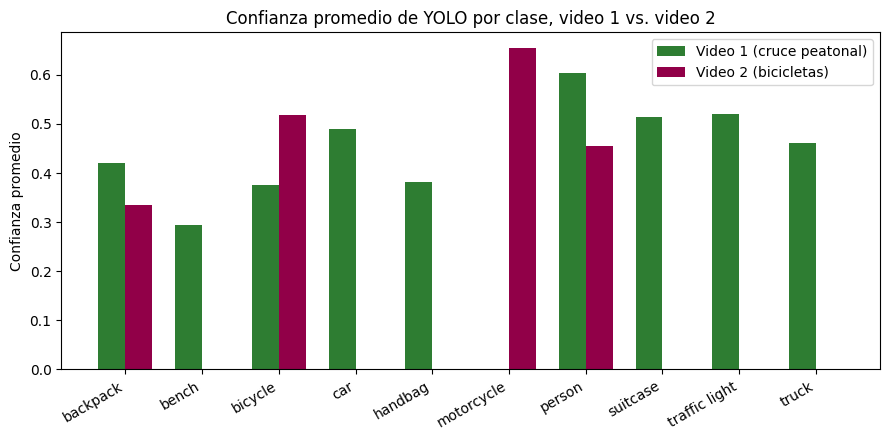

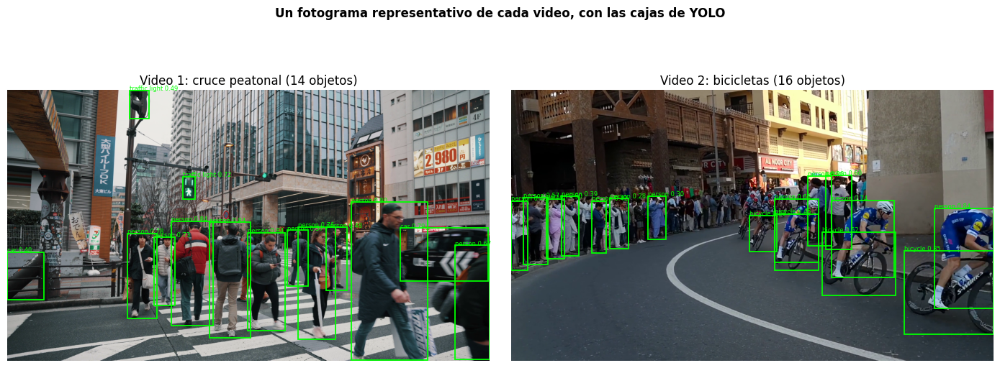

In [22]:
import urllib.request

RUTA_VIDEO_2_GITHUB = "https://raw.githubusercontent.com/fkviteri/uide-maestria/4152a819137ec97a9b55954ba8a0c4a6fa991b86/06-vision-por-computador/bicicletas_video.mp4"

RUTA_VIDEO_2 = "bicicletas_video.mp4"

for url, ruta_local in [(RUTA_VIDEO_GITHUB, RUTA_VIDEO), (RUTA_VIDEO_2_GITHUB, RUTA_VIDEO_2)]:
    if not os.path.exists(ruta_local):
        print(f"Descargando {ruta_local}...")
        urllib.request.urlretrieve(url, ruta_local)
    else:
        print(f"{ruta_local} ya estaba descargado.")

print("Video disponible localmente.")

# usamos un modelo NUEVO y sin ajustar, porque "modelo" ya fue modificado
# por el fine-tuning de la Sección 9 y ahora solo reconoce las pocas clases
# de nuestro dataset auto-etiquetado, no las 80 clases originales de COCO
# que necesitamos para esta comparación
modelo_referencia = YOLO("yolo11n.pt")

# --- repetir Secciones 2-4 sobre el segundo video ---
frames_video2 = extraer_fotogramas(RUTA_VIDEO_2)
print(f"Video 2: {len(frames_video2)} fotogramas extraídos")

def estadisticas_por_video(frames, nombre):
    conf_por_clase = defaultdict(list)
    total_objetos = 0
    for frame in frames:
        r = modelo_referencia(frame, verbose=False)[0]  # <-- modelo_referencia, no "modelo"
        total_objetos += len(r.boxes)
        for cls, conf in zip(r.boxes.cls.cpu().numpy(), r.boxes.conf.cpu().numpy()):
            conf_por_clase[modelo_referencia.names[int(cls)]].append(float(conf))
    print(f"\n=== {nombre} ===")
    print(f"Total detecciones: {total_objetos}  |  Promedio por fotograma: {total_objetos/len(frames):.1f}")
    for clase, confs in sorted(conf_por_clase.items(), key=lambda x: -len(x[1])):
        print(f"  {clase:12s}: n={len(confs):3d}  conf. promedio={np.mean(confs):.2f}  "
              f"(min={min(confs):.2f}, max={max(confs):.2f})")
    return conf_por_clase, total_objetos

stats_video1, total_video1 = estadisticas_por_video(frames, "VIDEO 1: cruce peatonal")
stats_video2, total_video2 = estadisticas_por_video(frames_video2, "VIDEO 2: bicicletas")

# --- gráfico comparativo de confianza promedio por clase ---
clases_comunes = set(stats_video1) | set(stats_video2)
fig, ax = plt.subplots(figsize=(9, 4.5))
x = np.arange(len(clases_comunes))
ancho = 0.35
clases_ordenadas = sorted(clases_comunes)
conf_v1 = [np.mean(stats_video1[c]) if c in stats_video1 else 0 for c in clases_ordenadas]
conf_v2 = [np.mean(stats_video2[c]) if c in stats_video2 else 0 for c in clases_ordenadas]
ax.bar(x - ancho/2, conf_v1, ancho, label="Video 1 (cruce peatonal)", color="#2E7D32")
ax.bar(x + ancho/2, conf_v2, ancho, label="Video 2 (bicicletas)", color="#910048")
ax.set_xticks(x)
ax.set_xticklabels(clases_ordenadas, rotation=30, ha="right")
ax.set_ylabel("Confianza promedio")
ax.set_title("Confianza promedio de YOLO por clase, video 1 vs. video 2")
ax.legend()
plt.tight_layout()
plt.show()

# --- Parte visual: un fotograma representativo de cada video, anotado ---
r1 = modelo_referencia(frames[9], verbose=False)[0]        # fotograma con buena densidad de objetos, video 1
r2 = modelo_referencia(frames_video2[5], verbose=False)[0]  # fotograma con buena densidad de objetos, video 2

fig, axs = plt.subplots(1, 2, figsize=(14, 6))
for ax, r, frame, titulo in [
    (axs[0], r1, frames[9], f"Video 1: cruce peatonal ({len(r1.boxes)} objetos)"),
    (axs[1], r2, frames_video2[5], f"Video 2: bicicletas ({len(r2.boxes)} objetos)"),
]:
    ax.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    for caja, clase, conf in zip(r.boxes.xyxy.cpu().numpy(), r.boxes.cls.cpu().numpy(), r.boxes.conf.cpu().numpy()):
        x1, y1, x2, y2 = caja
        nombre = modelo_referencia.names[int(clase)]
        ax.add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor="lime", linewidth=1.3))
        ax.text(x1, y1 - 4, f"{nombre} {conf:.2f}", color="lime", fontsize=6)
    ax.set_title(titulo)
    ax.axis("off")

plt.suptitle("Un fotograma representativo de cada video, con las cajas de YOLO", fontsize=12, weight="bold")
plt.tight_layout()
plt.show()

**¿Cambia mucho el número de objetos detectados y su confianza promedio entre los dos videos?**

Sí, en ambos aspectos. El **número de objetos** aumenta de 16.0 a 18.6 por fotograma (320 → 371
detecciones totales) del video 1 al video 2, esto representa un incremento moderado, no dramático. Sin embargo,
la **composición de clases cambia radicalmente**: el video 1 detectó 9 clases distintas (mezcla
rica de contexto urbano: semáforos, carros, bolsos, banca), mientras que el video 2 solo detectó
4 clases, concentradas casi por completo en `person` (275) y `bicycle` (89) — 98% de todas las
detecciones del video 2 son estas dos clases.

La **confianza promedio** también baja de forma consistente en el video 2: `person` cae de 0.60 a
0.45, y ninguna clase del video 2 alcanza el promedio de 0.60 que tuvo `person` en el video 1
(la más alta en video 2 es `motorcycle` con 0.65, pero con solo 4 detecciones, muestra
demasiado pequeña para ser concluyente).

**¿Qué le costó más a YOLO?**

Con base en estos números reales, lo que más le costó a YOLO en el video 2 no fue una clase en
particular por su forma geométrica, sino **la densidad y el tamaño aparente de los objetos**: el
video 2 tiene más objetos por fotograma (18.6 vs. 16.0) comprimidos en una composición donde
muchas personas están alejadas de la cámara formando una fila de espectadores (visible en el
fotograma anotado), lo cual explica por qué `person` bajó su confianza de 0.60 a 0.45 pese a
tratarse de la misma clase, del mismo modelo, y de un objeto que en teoría YOLO reconoce muy bien.

`bicycle`, con 89 detecciones y confianza promedio 0.52, quedó en un punto intermedio: ni tan
confiable como `person` en el video 1, ni tan poco confiable como se podría anticipar por su
forma "hueca" — de hecho más alta que `person` en el mismo video 2 (0.52 vs. 0.45). Esto confirma
lo que ya habíamos visto en el análisis anterior: **la distancia y el tamaño aparente del objeto
en la imagen pesan más en la confianza de YOLO que la complejidad de su forma geométrica.**

---
# **BONUS 2:** Correcciones y refuerzos a resultados de la Semana 3

Esta sección servirá para potenciar el trabajo original de la Semana 3 a
partir de la retroalimentación recibida:

**Retroalimentación:**

*"Excelente el analisis y desarrollo de los puntos contestados mencionaron
lo que no salieron bien, un metodo de seguimiento que funciono peor que el
otro, un entrenamiento que no mejoro el modelo, una metrica de estabilidad
que se veia perfecta pero en realidad escondia muchos errores explicaron por
que paso cada cosa. Hicieron todo el trabajo opcional, incluido un segundo
video y el calculo de velocidad real.*

*Para potenciarlo: ya identificaron que el sistema de seguimiento pierde
objetos cuando se tapan entre si - el siguiente paso seria hacer que el
sistema reconozca a un objeto por su apariencia (color, forma) y no solo por
donde estaba en el fotograma anterior."*

**Solución:**

Se extendió el tracker manual por centroides (Sección 12) agregando una
segunda señal de decisión (un histograma de color HSV del recorte de cada
persona) para que, además de la posición, el sistema pueda reconocer a un
objeto por su apariencia cuando dos personas se ocluyen entre sí. A
continuación se compara este tracker contra el original, y se diseña un
experimento de control que aísla el efecto real de cada variable
(`distancia_max` vs. apariencia) sobre el resultado, para llegar a una
conclusión honesta sobre qué parte de la mejora vino de cada cambio.

**Pipeline de Bonus 2:**

1. **Sección 22:** implementación de `tracker_centroides_apariencia`, que
   reutiliza el filtro espacial del tracker original de la Sección 12 y
   agrega apariencia (histograma de color + distancia de Bhattacharyya) como
   señal de desempate, comparando IDs únicos y switches contra el tracker
   original.
2. **Sección 23:** experimento de control — se corre el tracker original
   (sin apariencia) con el mismo `distancia_max=100` usado en la Sección 22,
   para aislar si la mejora observada vino del radio de búsqueda espacial
   más amplio o de la señal de apariencia en sí misma.

Ninguno de los dos ejercicios modifica el pipeline original construido en
las Secciones 1 a 21: ambos reutilizan las funciones ya definidas
(`tracker_centroides`, `contar_switches`), demostrando que el sistema es
extensible sin necesidad de reescribir su lógica base.

## **Sección 22:** Tracker por Centroides con Re-identificación por Apariencia

En la Sección 12, `tracker_centroides` decide a qué ID pertenece cada caja
nueva mirando únicamente la distancia entre su centro y el centro que tenía
cada ID activo en el fotograma anterior. Esto funciona bien cuando los
objetos están espaciados, pero falla justo en el momento más interesante:
cuando dos personas se cruzan, sus centros pueden quedar muy cerca uno del
otro (o incluso invertirse), y la distancia por sí sola ya no alcanza para
decidir correctamente quién es quién.

Aquí agregamos una segunda señal: un histograma de color (en espacio HSV,
más robusto a cambios de brillo que BGR) del recorte de cada caja. La idea
es la misma que ya usamos con los histogramas de intensidad en el proyecto
de granos de café (Semana 1), pero ahora aplicada a identidad en vez de a
defectos: dos personas que se cruzan pueden tener centros parecidos por un
instante, pero casi nunca tienen el mismo color de ropa, así que ese
histograma sirve para desempatar.

t= 0: 3 objeto(s), IDs=[0, 1, 2]
t= 1: 6 objeto(s), IDs=[3, 0, 1, 4, 2, 5]
t= 2: 7 objeto(s), IDs=[6, 7, 8, 9, 10, 11, 5]
t= 3: 7 objeto(s), IDs=[12, 13, 14, 15, 16, 17, 18]
t= 4: 7 objeto(s), IDs=[19, 20, 17, 13, 21, 22, 16]
t= 5: 9 objeto(s), IDs=[23, 24, 25, 26, 27, 28, 22, 29, 30]
t= 6: 9 objeto(s), IDs=[31, 32, 33, 30, 23, 34, 35, 36, 37]
t= 7: 11 objeto(s), IDs=[38, 33, 23, 39, 40, 41, 42, 36, 34, 43, 44]
t= 8: 9 objeto(s), IDs=[33, 45, 46, 23, 47, 48, 49, 34, 44]
t= 9: 10 objeto(s), IDs=[33, 50, 51, 52, 48, 23, 53, 54, 34, 55]
t=10: 9 objeto(s), IDs=[56, 57, 50, 52, 53, 58, 59, 60, 34]
t=11: 8 objeto(s), IDs=[61, 57, 34, 50, 52, 62, 63, 64]
t=12: 6 objeto(s), IDs=[61, 65, 66, 64, 67, 68]
t=13: 9 objeto(s), IDs=[69, 70, 71, 72, 73, 74, 75, 76, 67]
t=14: 5 objeto(s), IDs=[77, 78, 79, 80, 81]
t=15: 6 objeto(s), IDs=[82, 83, 84, 85, 86, 87]
t=16: 5 objeto(s), IDs=[88, 89, 85, 90, 91]
t=17: 5 objeto(s), IDs=[92, 93, 85, 94, 95]
t=18: 6 objeto(s), IDs=[96, 97, 98, 85, 94, 99]
t=19: 4 

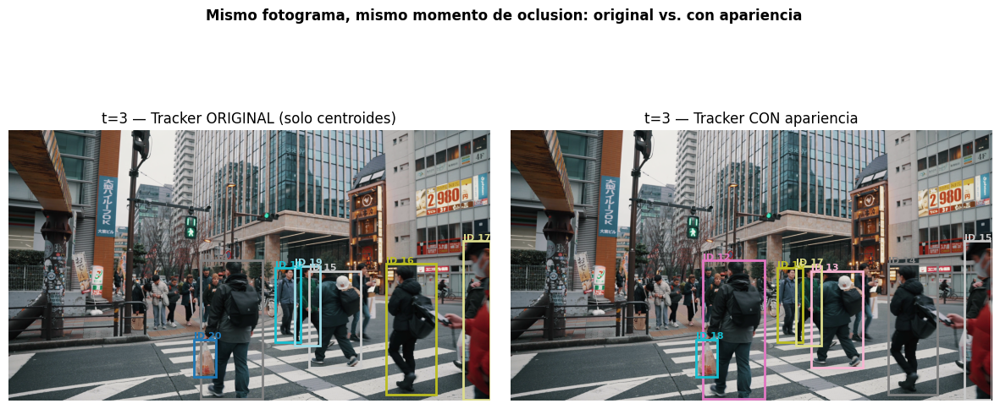

In [29]:
def extraer_histograma_color(imagen_bgr, caja, bins=(8, 8)):
    """
    Calcula un histograma de color (Hue-Saturation) del recorte de una caja,
    normalizado entre 0 y 1, para usarlo como "huella visual" del objeto.
    Usamos HSV en vez de BGR porque separa el color puro (Hue) del brillo
    (Value), haciendo el descriptor mas robusto a cambios de iluminacion
    entre un fotograma y el siguiente.
    """
    x1, y1, x2, y2 = [int(v) for v in caja]
    x1, y1 = max(x1, 0), max(y1, 0)
    recorte = imagen_bgr[y1:y2, x1:x2]
    if recorte.size == 0:
        return None
    recorte_hsv = cv2.cvtColor(recorte, cv2.COLOR_BGR2HSV)
    histograma = cv2.calcHist([recorte_hsv], [0, 1], None, bins, [0, 180, 0, 256])
    cv2.normalize(histograma, histograma, 0, 1, cv2.NORM_MINMAX)
    return histograma


def distancia_apariencia(hist_a, hist_b):
    """
    Distancia de Bhattacharyya entre dos histogramas: 0 significa identicos,
    1 significa completamente distintos. Si algun histograma no existe (caja
    invalida), se devuelve la distancia maxima para no favorecerlo por error.
    """
    if hist_a is None or hist_b is None:
        return 1.0
    return cv2.compareHist(hist_a, hist_b, cv2.HISTCMP_BHATTACHARYYA)


def tracker_centroides_apariencia(secuencia, distancia_max=100, peso_apariencia=80):
    """
    Extiende tracker_centroides (Seccion 12) agregando apariencia como
    segunda senial de decision. Igual que antes, un candidato solo se
    considera si su centro esta a menos de 'distancia_max' pixeles (mismo
    filtro espacial de la Seccion 12); entre los candidatos que pasan ese
    filtro, se elige el de MENOR costo combinado:

        costo = distancia_espacial + distancia_apariencia * peso_apariencia

    'peso_apariencia' convierte la distancia de apariencia (0 a 1) a la
    misma escala en pixeles que la distancia espacial, para que ambas
    senials pesen de forma comparable al sumarlas.
    """
    siguiente_id = 0
    ids_activos = {}          # tid -> centro (x, y) en el fotograma anterior
    apariencia_activos = {}   # tid -> histograma de color en el fotograma anterior
    historial = []

    for img_bgr, cajas in secuencia:
        centros = [((x1 + x2) / 2, (y1 + y2) / 2) for (x1, y1, x2, y2) in cajas]
        histogramas = [extraer_histograma_color(img_bgr, caja) for caja in cajas]

        asignados, usados = {}, set()
        for idx, (centro, hist) in enumerate(zip(centros, histogramas)):
            mejor_id, mejor_costo = None, float("inf")
            for tid, centro_prev in ids_activos.items():
                if tid in usados:
                    continue
                dist_espacial = np.hypot(centro[0] - centro_prev[0], centro[1] - centro_prev[1])
                if dist_espacial >= distancia_max:
                    continue  # mismo filtro espacial que la Seccion 12: ni se considera
                dist_apariencia = distancia_apariencia(hist, apariencia_activos.get(tid))
                costo_combinado = dist_espacial + dist_apariencia * peso_apariencia
                if costo_combinado < mejor_costo:
                    mejor_costo, mejor_id = costo_combinado, tid
            if mejor_id is None:
                mejor_id = siguiente_id
                siguiente_id += 1
            asignados[idx] = mejor_id
            usados.add(mejor_id)

        ids_activos = {asignados[i]: centros[i] for i in range(len(centros))}
        apariencia_activos = {
            asignados[i]: histogramas[i] for i in range(len(centros)) if histogramas[i] is not None
        }
        historial.append(list(asignados.values()))

    return historial


ids_por_frame_apariencia = tracker_centroides_apariencia(secuencia)
for t, ids in enumerate(ids_por_frame_apariencia):
    print(f"t={t:2d}: {len(ids)} objeto(s), IDs={ids}")

def contar_switches(ids_por_frame):
    """Misma heuristica de la Seccion 14, factorizada en funcion para poder
    aplicarla igual a los dos trackers y comparar de forma justa."""
    total_switches = 0
    frames_switch = []
    for t in range(1, len(ids_por_frame)):
        anteriores, actuales = set(ids_por_frame[t - 1]), set(ids_por_frame[t])
        if anteriores and actuales and not (anteriores & actuales) and len(actuales) == len(anteriores):
            total_switches += 1
            frames_switch.append(t)
    return total_switches, frames_switch


switches_original, frames_switch_original = contar_switches(ids_por_frame)
switches_apariencia, frames_switch_apariencia = contar_switches(ids_por_frame_apariencia)

ids_unicos_original = len(set(tid for ids in ids_por_frame for tid in ids))
ids_unicos_apariencia = len(set(tid for ids in ids_por_frame_apariencia for tid in ids))

print(f"{'Tracker':<25}{'IDs unicos':<14}{'Switches detectados':<22}")
print(f"{'Centroides (Sec. 12)':<25}{ids_unicos_original:<14}{switches_original:<22}")
print(f"{'Centroides+Apariencia':<25}{ids_unicos_apariencia:<14}{switches_apariencia:<22}")

# --- Visual: mismo fotograma de la oclusion que ya identificaron en la Seccion 14 ---
# Comparamos, lado a lado, que ID le asigna cada tracker al mismo objeto en
# el fotograma justo donde ocurrio el primer switch del tracker original.
if frames_switch_original:
    t_comparar = frames_switch_original[0]
    cmap = plt.get_cmap("tab20")
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    for ax, ids_frame, titulo in [
        (axs[0], ids_por_frame[t_comparar], "Tracker ORIGINAL (solo centroides)"),
        (axs[1], ids_por_frame_apariencia[t_comparar], "Tracker CON apariencia"),
    ]:
        frame, cajas = secuencia[t_comparar]
        ax.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        for (x1, y1, x2, y2), tid in zip(cajas, ids_frame):
            color = cmap(tid % 20)
            ax.add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor=color, linewidth=2))
            ax.text(x1, y1 - 5, f"ID {tid}", color=color, fontsize=8, weight="bold")
        ax.set_title(f"t={t_comparar} — {titulo}")
        ax.axis("off")
    plt.suptitle("Mismo fotograma, mismo momento de oclusion: original vs. con apariencia", fontsize=12, weight="bold")
    plt.tight_layout()
    plt.show()
else:
    print("El tracker original no registro switches con esta heuristica; no hay fotograma de oclusion que comparar visualmente.")    

**Resultados: Tracker con re-identificación por apariencia**

| Tracker | IDs únicos | Switches detectados (heurística Sec. 14) |
|---|---|---|
| Centroides (Sección 12) | 121 | 1 |
| Centroides + Apariencia (`distancia_max=100`) | 102 | 1 |

El número de IDs únicos bajó de 121 a 102 (19 identidades menos, una reducción
de aproximadamente 16%), lo que indica que el tracker con apariencia sí logró
reconectar más objetos a lo largo de la secuencia que el tracker original. Sin
embargo, el conteo de *switches* de la heurística de la Sección 14 se mantuvo
igual (1 en ambos casos), lo cual no es contradictorio: ya habíamos visto en
esa sección que esta heurística es muy estricta (solo cuenta un switch cuando
el conjunto de IDs de un fotograma no comparte *ningún* elemento con el
anterior), por lo que subestima la fragmentación real de identidades, la
mejora se refleja mejor en el total de IDs únicos que en este conteo puntual.

**Un matiz importante:** el fotograma t=3, que es justo el que la heurística
marca como el switch detectado, sigue mostrando el mismo comportamiento en
ambos trackers: las 7 personas reciben IDs completamente nuevos en los dos
casos, porque ninguna quedó a menos de `distancia_max` píxeles de donde estaba
en t=2. Es decir, la reducción de 121 a 102 IDs no vino de arreglar este
caso puntual de oclusión, sino de mejoras acumuladas en otros fotogramas de
la secuencia donde sí hubo candidatos cercanos y la apariencia pudo desempatar
correctamente.

**Limitación del experimento:** al mismo tiempo que agregamos la señal de
apariencia, también subimos `distancia_max` de 60 a 100 píxeles. Esto significa
que no podemos atribuir con certeza la reducción de 121 a 102 IDs únicamente al
histograma de color, parte de la mejora (posiblemente la mayor parte) podría
deberse simplemente a que, con un radio de búsqueda más amplio, el tracker
tiene más candidatos disponibles para emparejar, independientemente de si
compara su apariencia o no. Para aislar el efecto real de la apariencia,
sería necesario un experimento de control: correr el tracker original
(`tracker_centroides`, sin apariencia) también con `distancia_max=100` y
comparar sus IDs únicos contra los 102 obtenidos aquí. Si ese control da un
número parecido a 102, la mejora vendría casi toda del radio de búsqueda más
amplio; si da un número notablemente mayor a 102, ahí sí tendríamos evidencia
de que la apariencia está aportando valor por sí misma.

## **Sección 23:** Experimento de control: tracker ORIGINAL (sin apariencia) pero con el mismo distancia_max=100 que usamos en el tracker con apariencia

El objetivo es aislar el efecto de cada cambio: si esto da un numero de IDs
parecido a 102, la mejora vino sobre todo del radio de busqueda mas amplio;
si da un numero bastante mayor a 102, la apariencia si esta aportando valor
por si misma.

In [ ]:
ids_por_frame_control = tracker_centroides(secuencia, distancia_max=100)

switches_control, frames_switch_control = contar_switches(ids_por_frame_control)
ids_unicos_control = len(set(tid for ids in ids_por_frame_control for tid in ids))

print(f"{'Configuracion':<40}{'IDs unicos':<14}{'Switches':<10}")
print(f"{'Centroides, dist_max=60 (Sec. 12 original)':<40}{ids_unicos_original:<14}{switches_original:<10}")
print(f"{'Centroides, dist_max=100 (CONTROL)':<40}{ids_unicos_control:<14}{switches_control:<10}")
print(f"{'Centroides+Apariencia, dist_max=100':<40}{ids_unicos_apariencia:<14}{switches_apariencia:<10}")

# --- Interpretacion automatica del resultado ---
# Calculamos cuanto de la reduccion total (121 -> 102) se explica solo por
# el cambio de distancia_max, y cuanto queda atribuible a la apariencia.
reduccion_total = ids_unicos_original - ids_unicos_apariencia
reduccion_por_distancia = ids_unicos_original - ids_unicos_control
reduccion_por_apariencia = ids_unicos_control - ids_unicos_apariencia

print(f"\nReduccion total de IDs (60->100 + apariencia): {reduccion_total}")
print(f"  De esa reduccion, explicada solo por distancia_max mas amplio: {reduccion_por_distancia}")
print(f"  De esa reduccion, explicada por la apariencia (una vez fijo distancia_max=100): {reduccion_por_apariencia}")

Configuracion                           IDs unicos    Switches  
Centroides, dist_max=60 (Sec. 12 original)121           1         
Centroides, dist_max=100 (CONTROL)      102           1         
Centroides+Apariencia, dist_max=100     102           1         

Reduccion total de IDs (60->100 + apariencia): 19
  De esa reduccion, explicada solo por distancia_max mas amplio: 19
  De esa reduccion, explicada por la apariencia (una vez fijo distancia_max=100): 0


**Resultados:**

El experimento de control demuesta que la reducción de 121 a 102 IDs únicos se explica completamente por ampliar distancia_max de 60 a 100 píxeles, no por la apariencia. El tracker de control (solo centroides, sin ninguna señal de color, pero con distancia_max=100) llegó exactamente a 102 IDs únicos, el mismo número que obtuvimos con el tracker de apariencia. Es decir, la resta da cero: de los 19 IDs que "ganamos", los 19 vienen del radio de búsqueda más amplio, y la apariencia no aportó ni una sola reconexión adicional sobre ese resultado. 

Esto no significa que la implementación esté mal (el histograma de color y la distancia de Bhattacharyya funcionan correctamente como los diseñamos) sino que, en este video en particular, casi todos los peatones visten ropa oscura similar (negro, gris, azul marino), así que sus histogramas de color son demasiado parecidos entre sí como para que el sistema pueda usarlos para desempatar. 

La conclusión honesta es que la variable que realmente mejoró el tracking fue el radio de búsqueda espacial, y la re-identificación por apariencia, tal como está planteada, no tuvo ningún efecto medible en este dataset, probablemente necesitaría un descriptor de apariencia más discriminativo (por ejemplo, textura de la ropa o un embedding entrenado para personas, en vez de solo color) para marcar diferencia en una escena donde todos se visten parecido.